# Project 1: Pose Graph Optimization (scratch + g2o)
TEAM-ID: 23                  
TEAM-NAME: outliers                     
YOUR-ID: 2018101025                
YOUR-NAME: Kanish Anand               

(Although you work in groups, both the students have to submit to Moodle, hence there's name field above)

### Submission
Zip a folder of the following:
1. Files that you were provided with: `Project-1.ipynb`, the folders `misc` and `dataset`. Rest of the files asked in the questions below must be generated when i run the code. If generation of any file is computationally intensive, add `filename_backup.extension` where `filename.extension` is the expected name of file when i run the code. (For example, next point.)
2. Add `opt_backup.g2o` (described below) in outermost directory. Here, `opt.g2o` is the expected name of the file when I run the code.
3. For images of any results (like plots), save it in `./misc` folder.

On Moodle, all you have to submit is the jupyter notebook. But make sure to call the necessary functions explicitly (as specified in the notebook). The name of the zipped file being submitted to Moodle Assignment portal MUST BE `ID_Teamname_Firstname`. More details [here](https://www.notion.so/saishubodh/Course-Information-4c9e487b118547b2ba91d24e0dcaf04e#f2707a04f2a0446bac77763b47ba4bac).

On GitHub classrooms, the latest commit before the deadline will be considered as the submission. 

The deadline is Oct 16, 23:55 IST. Please get started ASAP, there is no way you can finish this project during the last few days before the deadline.

### General instructions

This ipython notebook (`.ipynb`) on GitHub is self-sufficient and has all the information you need to get started with the assignment, you don't need any corresponding PDF doc. Just fire up the notebook and get going!

General information like installation instructions in supplementary notebook "Project-1_Code-Walkthrough". Please take a look at it before you start this assignment.

Whenever I mention some `func()` below, I am referring to the "helper functions" in another supplementary notebook "Project-1_Code-Walkthrough" provided to you. Whenever I ask you to insert image below, it is better to save the image in `misc` and load it using `![file_name](file_location)` instead of directly pasting.    

[[CP-]] refers to CheckPoint, you have to ensure you do the tasks at each of the [[CP-]] places below. Not ensuring [[CP-B]] (CheckPoint-Basic) will incur heavy penalty and potentially 0 for that sub-section, and [[CP-M]] (CheckPoint-Marks) has a particular mark weightage depending on your results at that particular CP.

If you face any issues related to coding/installation, please raise an [issue here](https://github.com/Shubodh/MR-project1-pgo/issues). For any conceptual doubts, you can ask on Moodle or Teams as usual.

# 0. Introduction

In this project, we are going to use a non-linear weighted least squares optimization approach to solve the problem of getting a better estimate of our robot's trajectory. Least squares formulations are widely used for optimization, be it computer vision or robotics or machine learning. We will dive deep into it during this project and you will have complete clarity on optimization for vector-valued residual functions. 

In this "Introduction" section, I am going to provide an introduction for SLAM problem for a robot operating in the 2D world. It is 2. section in this Project. The 1D SLAM problem (1.) is far much simpler to understand and will be described directly in the 1. section. 

In a 2D world, a robot has 3 degrees of freedom, i.e. its pose in the world can be expressed by the state vector $\mathbf{x}=(x, y, \theta)^{\mathrm{T}}$. For the scope of this project, we are interested only in the robot's trajectory through the $2 \mathrm{D}$ world, and NOT in distinct landmarks or the surronding map of the environment, i.e. we are only interested in "L"ocalization part of SLAM. 

Therefore, we can represent it as a graph where the vertices represent robot poses $\mathbf{x}_{i}$ and edges represent the spatial constraints between these poses. Such a map is generally called a pose graph.

Two different kinds of constraints are necessary for pose graph SLAM. The first are
odometric constraints that connect two successive states $\mathbf{x}_{i}$ and $\mathbf{x}_{i+1}$ via a motion model. Furthermore, in order to perform loop closing, the robot has to recognize places it already visited before. This place recognition is also a part of the front-end and provides the second type of constraint, the loop closure constraints. These constraints connect two not necessarily successive poses $\mathbf{x}_{i}$ and $\mathbf{x}_{j}$.


![SLAM-trajectory-lc.png](misc/SLAM-trajectory-lc.png)   ![SLAM-trajectory-robust.png](misc/SLAM-trajectory-robust.png) (Source: [Sunderhauf 2012](https://core.ac.uk/download/pdf/89299995.pdf))

You will start from the inaccurate pose graph with odometry and loop closure information and by the end of this Project, you end up with an optimized pose graph (see above images) which should look close to ground truth trajectory. You can watch [this video](https://youtu.be/saVZtgPyyJQ) to get an intuition for what we're about to do.

Okay, that's enough of theory. Let's get out hands dirty with the code!

In [1]:
import matplotlib.pyplot as plt
import math
import os
import jax.numpy as jnp #see supplementary notebook to see how to use this
import jax

# If you're `importing numpy as np` for debugging purposes, 
# while submitting, please remove 'import numpy' and replace all np's with jnp's.(more in supplementary notebook)

plt.style.use('seaborn')

# 1. Pose Graph Optimization for 1D SLAM

A solved example for 1D SLAM which optimizes for pose variables using weighted least squares method (Gauss Newton) has been explained in the class. It has been made [available here](https://www.notion.so/saishubodh/Solved-Example-1D-SLAM-weighted-LS-Illustrating-Sparsity-in-SLAM-d8b45893843b4377b07b1d4aa1aab4de). Your first task is to code this from scratch. [[CP-M]]

For this section, you have to calculate Jacobian analytically yourself and use it. However, you can check how correct `jax`'s `jacobian`. Its usage is explained in the supplementary notebook.

In [2]:
def new_pose(pos_i, odometer_i):
    return pos_i + odometer_i

def residual(pos, odometer):
    fx = []
    for i in range(odometer.shape[0]):
        if i == 4:
            # loop closure
            fx.append(new_pose(pos[0], odometer[i]) - pos[i])
        else:
            fx.append(new_pose(pos[i], odometer[i]) - pos[i + 1])
    
    #anchor
    fx.append(pos[0])
    # fx = jnp.array([ pos[0] + odometer[0], pos[1] + odometer[1], pos[2] + odometer[2], pos[3] + odometer[3], pos[0] + odometer[4], pos[0]])
    #fx_i = jnp.array([ fx[0] - pos[1], fx[1] - pos[2], fx[2] - pos[3], fx[3] - pos[4], fx[4] - pos[4], fx[5] - 0])
    return jnp.asarray(fx)
        
def get_error(pos, odometer,weights):
    fx = residual(pos, odometer)
    err = 0.5 * fx.T @ weights @ fx
    return err

def jax_jacobian(pos,odometer):
    J = jax.jacfwd(residual)
    return J(pos, odometer)

def analytical_jacobian():
    J = jnp.array([[1, -1, 0, 0, 0],
                   [0, 1, -1, 0, 0],
                   [0, 0, 1, -1, 0],
                   [0, 0, 0, 1, -1],
                   [1, 0, 0, 0, -1],
                   [1, 0, 0, 0, 0],
                  ])
    return J

def frobNorm(P1, P2):
    val = jnp.linalg.norm(P1 - P2)
    return val

In [3]:
##############################################################################
# TODO: Code for Section 1                                                   #

# given data
odometer = jnp.array([1.1, 1, 1.1, -2.7, 0])
pos = jnp.array([0, 1.1, 2.1, 3.2, 0.5])

weights = jnp.diag(jnp.array([100, 100, 100, 100, 100, 1000]))

iterations = 5
error_history = []

J_theirs = jax_jacobian(pos,odometer)
J_ours = analytical_jacobian()

print("Frobenius norm between JAX jacobian and analytical jacobian is:",frobNorm(J_theirs, J_ours))


for i in range(iterations):

    J = jax_jacobian(pos,odometer)
    
    # H @ delta_x = -b
    H = J.T @ weights @ J
    b = J.T @ weights.T @ residual(pos, odometer)

    delta_x = -b @ jnp.linalg.inv(H)
    print('\n')
    err = get_error(pos, odometer, weights)
    print("ITERATION", i, " ERROR:", err)
    error_history.append(err)
    print('\n')
    print(delta_x)
    pos = pos + delta_x
    print(pos)
##############################################################################
#                             END OF YOUR CODE                               #
##############################################################################

/home/kanish/.local/lib/python3.6/site-packages/jax/lib/xla_bridge.py:130: UserWarning: No GPU/TPU found, falling back to CPU.
  warnings.warn('No GPU/TPU found, falling back to CPU.')


Frobenius norm between JAX jacobian and analytical jacobian is: 0.0


ITERATION 0  ERROR: 12.5


[-7.4505806e-09 -9.9999979e-02 -1.9999996e-01 -3.0000013e-01
 -4.0000007e-01]
[-7.4505806e-09  1.0000000e+00  1.9000000e+00  2.8999999e+00
  9.9999934e-02]


ITERATION 1  ERROR: 2.5000002


[7.0929560e-09 2.3007392e-08 4.3690214e-08 1.8835068e-07 6.4790250e-08]
[-3.576246e-10  1.000000e+00  1.900000e+00  2.900000e+00  1.000000e-01]


ITERATION 2  ERROR: 2.5


[ 2.9798664e-11  1.7493967e-08  3.9726501e-08 -5.2481891e-08
 -3.1292449e-09]
[-3.2782593e-10  1.0000000e+00  1.9000000e+00  2.9000001e+00
  1.0000000e-01]


ITERATION 3  ERROR: 2.5


[ 2.7755576e-16  1.7464167e-08  3.9696701e-08 -5.2511684e-08
 -3.1590415e-09]
[-3.2782566e-10  1.0000000e+00  1.9000000e+00  2.9000001e+00
  1.0000000e-01]


ITERATION 4  ERROR: 2.5


[ 2.7755576e-16  1.7464167e-08  3.9696701e-08 -5.2511684e-08
 -3.1590415e-09]
[-3.2782538e-10  1.0000000e+00  1.9000000e+00  2.9000001e+00
  1.0000000e-01]


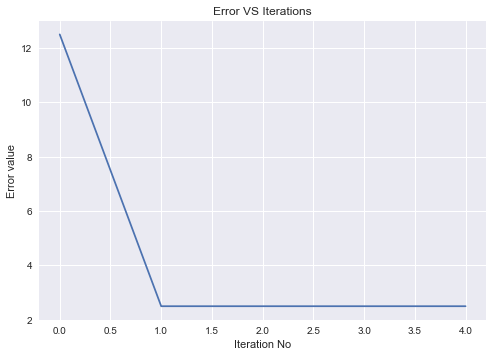

In [4]:
plt.title("Error VS Iterations")
plt.xlabel("Iteration No")
plt.ylabel("Error value")
plt.plot(error_history)

**In above question it converged to optima in only 1 iteration because motion model is linear here so basically this is a linear least square problem and not non linear least square. Therefore it has a closed form solution**

# 2. Pose Graph Optimization for 2D SLAM

Things are about to get interesting!

## 2.1 Coding from scratch

### Objective
A robot is travelling in a oval trajectory. It is equipped with wheel odometry for odometry information and RGBD sensors for loop closure information. Due to noise in wheel odometry it generates a noisy estimate of the trajectory. Our task is to use loop closure pairs to correct the drift.

We pose this problem as a graph optimization problem. In our graph, poses are the vertices and constraints are the edges. 

### Given: 
In practical scenarios, we'd obtain the following from our sensors after some post-processing:
1. Initial position
2. Odometry Contraints/Edges: This "edge" information basically tells us relative transformation between two nodes. These two nodes are consecutive in the case of Odometry but not in the case of Loop Closure (next point).
3. Loop Closure Contraints/Edges
Remember that while optimizing, you have another kind of "anchor" edge as you've seen in 1. solved example.

You have been given a text file named `edges.txt` which has all the above 3 and it follows G2O's format (as explained in class, [link here](https://www.notion.so/saishubodh/G2O-Edge-Description-fa07cc28967541dc8a71170de46c5da7) ).

### Details:
1. Using the following motion model, you have to first generate the "initialization" for all the poses/vertices using the "Given" information. Just like in the 1D case.
$$x_{k+1} = x_{k} + \Delta x_{(k,k+1)} \cos(\theta_k) - \Delta y_{(k,k+1)} \sin(\theta_k) \\
y_{k+1} = y_{k} + \Delta y_{(k,k+1)} \cos(\theta_k) + \Delta x_{(k,k+1)} \sin(\theta_k) \\
\theta_{k+1} = \theta_{k}+  \Delta \theta_{(k,k+1)} \tag{3}$$

Even the loop closure nodes are related by the above model, except that it need not necessarily be consecutive notes k and k+1.

Save this initial trajectory as `edges-poses.g2o`.

If you plot the initialized poses using odometry information, you need to get as the right plot [[CP-M]] below (this is the "noisy trajectory"): (Left one is the ground truth)
![robot-poses-MR-P1.png](./misc/robot-poses-MR-P1.png)
(Use `draw()` helper function or `g2o_viewer` or `EVO`)

2. Now calculate the residual and the Jacobian and update your parameters using LM.

Use LM algorithm. Regarding Jacobian calculation, you can use `jax`'s `jacobian` as part of your main code. However, you still have to separately calculate it analytically and verify if it matches with `jax`'s `jacobian` using [[CP-M]] frobenius norm `frobNorm()`). Calculation and verification is compulsory, but it is your choice to use whichever as part of your optimization. Use whichever is faster.

3. Regarding LM iterations, stopping criterion, information matrix values.

    1. [[CP-B]] As your iterations proceed, you have to print relevant information (iteration number and error value: [$F = \frac{1}{2}  \mathbf{f}^{\top} \mathbf{\Omega} \mathbf{f} $ (notion page link)](https://www.notion.so/saishubodh/From-linear-algebra-to-non-linear-weighted-least-squares-optimization-13cf17d318be4d45bb8577c4d3ea4a02#32832dee7d6c4ab49581463d9b784f21) at every step).
    
    2. [[CP-B]] You have to show the plots (ground truth, noisy & optimized: all 3 in a single plot) at every 10 steps or so.

    3. [[CP-M]] You could start with information values of 500 for odom edges, 700 for loop closure edges, 1000 for anchor edge (same for all dimensions). However, you have to _heavily_ experiment with these values. (Given that you somehow know loop closure information is way more reliable than odometry.). At the end of your experimentation, your error $F = \frac{1}{2}  \mathbf{f}^{\top} \mathbf{\Omega} \mathbf{f} $ should by < 40. Explain your experimentation in detail using tables/plots etc if necessary.
    
Do not worry if you're not getting a perfect trajectory. Our parametrization was oversimplified for the sake of this project. With that being said, it is possible to get the error down to < 40 and make it at least look like an oval shaped trajectory, even if it doesn't perfectly resemble the ground truth. However, using `g2o` (next section), you will be getting a close to ground truth trajectory.

In [5]:
# CONSTANTS
NUM_VARS = 3
WEIGHT_ODOMETRY = 100
WEIGHT_LOOP_CLOSURE = 1000
WEIGHT_ANCHOR = 2000

LM_LAMBDA = 1
NUM_ITERS = 100
TOL = 1e-6

In [6]:
# UTILITY FUNCTIONS

def read_vertex(fileName):
    f = open(fileName, 'r')
    A = f.readlines()
    f.close()

    x_arr = []
    y_arr = []
    theta_arr = []

    for line in A:
        if "VERTEX_SE2" in line:
            (ver, ind, x, y, theta) = line.split()
            x_arr.append(float(x))
            y_arr.append(float(y))
            theta_arr.append(float(theta.rstrip('\n')))

    return jnp.array([x_arr, y_arr, theta_arr])

def read_edge(fileName):
    f = open(fileName, 'r')
    A = f.readlines()
    f.close()

    ind1_arr = []
    ind2_arr = []
    del_x = []
    del_y = []
    del_theta = []

    for line in A:
        if "EDGE_SE2" in line:
            (edge, ind1, ind2, dx, dy, dtheta, _, _, _, _, _, _) = line.split()
            ind1_arr.append(int(ind1))
            ind2_arr.append(int(ind2))
            del_x.append(float(dx))
            del_y.append(float(dy))
            del_theta.append(float(dtheta))

    return (jnp.array( ind1_arr), jnp.array(ind2_arr), jnp.array(del_x), jnp.array(del_y), jnp.array(del_theta))

# plot trajectory using matplotlib
def draw(X, Y, THETA):
    ax = plt.subplot(111)
    ax.plot(X, Y, 'ro')
    plt.plot(X, Y, 'c-')

    for i in range(len(THETA)):
        x2 = 0.25*math.cos(THETA[i]) + X[i]
        y2 = 0.25*math.sin(THETA[i]) + Y[i]
        plt.plot([X[i], x2], [Y[i], y2], 'g->')

    plt.show()
    
# motion model
def next_pose(x, y, theta, del_x, del_y, del_theta):
    x_new = x + del_x * jnp.cos(theta) - del_y * jnp.sin(theta)
    y_new = y + del_y * jnp.cos(theta) + del_x * jnp.sin(theta)
    theta_new = theta + del_theta
    return jnp.array([x_new, y_new, theta_new])

def write_poses(poses,file_name):
    with open(file_name, 'w') as f:
        for i in range(poses.shape[0]):
            st = "VERTEX_SE2 " + str(i) + " " + str(poses[i][0]) + " " + str(poses[i][1]) + " " + str(poses[i][2])
            f.write("%s\n" % st)
        
        # write edges and FIX
        f2 = open('dataset/edges.txt', 'r')
        A = f2.readlines()
        f2.close()
        
        for line in A:
            if "VERTEX_SE2" not in line:
                f.write("%s" % line)

## Q 2.1.1

Poses (Vertices): (120, 3)


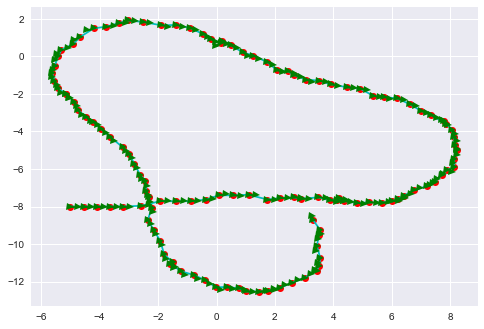

In [7]:
##############################################################################
# TODO: Code for Section 2.1                                                 #
##############################################################################

# READ INPUT FILE AND GENERATE POSES

vertex = read_vertex('dataset/edges.txt')
edges = read_edge('dataset/edges.txt')
x = vertex[0][0]
y = vertex[1][0]
theta = vertex[2][0]

poses = []
poses.append(jnp.array([x, y, theta]))

for i in range(edges[0].shape[0]):
    ind1 = edges[0][i]
    ind2 = edges[1][i]
    
    if(abs(ind2 - ind1) > 1):
        break # do not include loop closure constrains
    
    del_x = edges[2][i]
    del_y = edges[3][i]
    
    del_theta = edges[4][i]
    
    x, y, theta = next_pose(x, y, theta, del_x, del_y, del_theta) # use odometry to get the next pose
    poses.append(jnp.array([x, y, theta]))
    
poses = jnp.array(poses)
anchor = poses[0, :]
print('Poses (Vertices):', poses.shape)
draw(poses[:,0], poses[:,1], poses[:,2])
write_poses(poses, 'edges-poses.g2o')

##############################################################################
#                             END OF YOUR CODE                               #
##############################################################################

![edges-poses.png](./misc/edges_original.png) 

In [8]:
# KEY FUNCTIONS

# Order of edges:
## x_anchor
## y_anchor
## theta_anchor
## for every edge:
### x_i
### y_i
### theta_i

# Order of pose variables
## for every edge:
### x_i
### y_i
### theta_i
# WRITE ALL VERTICES IN g2o FORMAT

def derivative_with_initial(x_i, y_i, theta_i, x_f, y_f, theta_f, del_x, del_y, del_theta):
    result = jnp.eye(NUM_VARS)
    
    result = jax.ops.index_update(result, jax.ops.index[0, 2], - del_x * jnp.sin(theta_i) - del_y * jnp.cos(theta_i))    
    result = jax.ops.index_update(result, jax.ops.index[1, 2], - del_y * jnp.sin(theta_i) + del_x * jnp.cos(theta_i))
    return result
    
def derivative_with_final(x_i, y_i, theta_i, x_f, y_f, theta_f, del_x, del_y, del_theta):
    result = -1 * jnp.eye(NUM_VARS)
    return result

def information_matrix(edges, weight_odom, weight_loop, weight_anchor):
    # edge x edge matrix
    diagonal = []
    
    # anchor edge
    diagonal.extend([weight_anchor] * NUM_VARS)
    
    for i in range(edges[0].shape[0]):
        ind1 = edges[0][i]
        ind2 = edges[1][i]
        if abs(ind2 - ind1) == 1:
            # odom edges
            diagonal.extend([weight_odom] * NUM_VARS)
        else:
            # loop closure edges
            diagonal.extend([weight_loop] * NUM_VARS)
    
    return jnp.diag(jnp.array(diagonal))

def residual(current_poses, edges, anchor):
    residue = []
    
    # anchor edges
    residue.extend(list(current_poses[0] - anchor))
    
    # other edges
    for i in range(edges[0].shape[0]):
        ind1 = edges[0][i]
        ind2 = edges[1][i]
        
        del_x = edges[2][i]
        del_y = edges[3][i]
        del_theta = edges[4][i]
        
        estimated_pose_2 = next_pose(*current_poses[ind1], del_x, del_y, del_theta)
        diff = list(estimated_pose_2 - current_poses[ind2])
        residue.extend(diff)
    
    return jnp.asarray(residue)


def jacobian(current_poses, edges):
    num_constraints = (edges[0].shape[0] * NUM_VARS) + NUM_VARS # for anchor edges
    num_variables = current_poses.shape[0] * NUM_VARS
    
    # constraints are ordered as in `edges`
    # variables are ordered as in `current_poses`
    
    J = jnp.zeros((num_constraints, num_variables))
    
    # for anchor edges
    J = jax.ops.index_update(J, jax.ops.index[:NUM_VARS, :NUM_VARS], jnp.eye(NUM_VARS))
    
    # for other edges
    for i in range(edges[0].shape[0]):
        ind1 = edges[0][i]
        ind2 = edges[1][i]
        del_x = edges[2][i]
        del_y = edges[3][i]
        del_theta = edges[4][i]
        
        J = jax.ops.index_update(
                J,
                jax.ops.index[NUM_VARS + i * NUM_VARS:NUM_VARS + i * NUM_VARS + NUM_VARS, ind1 * NUM_VARS: ind1 * NUM_VARS + NUM_VARS],
                derivative_with_initial(*poses[ind1], *poses[ind2], del_x, del_y, del_theta)
            )
        
        J = jax.ops.index_update(
                J,
                jax.ops.index[NUM_VARS + i * NUM_VARS:NUM_VARS + i * NUM_VARS + NUM_VARS, ind2 * NUM_VARS: ind2 * NUM_VARS + NUM_VARS],
                derivative_with_final(*poses[ind1], *poses[ind2], del_x, del_y, del_theta)
            )
    
    return J

def get_error(poses, edges, weights, anchor):
    f = residual(poses, edges, anchor)
    return 0.5 * f.T @ weights @ f

def step_lm(poses, edges, weights, anchor, lamda):
    f = residual(poses, edges, anchor)
    J = jacobian(poses, edges)
    
    step = - jnp.linalg.inv(J.T @ weights @ J + lamda * jnp.eye(J.shape[1])) @ J.T @ weights.T @ f
    return step.reshape((-1, NUM_VARS))

## Comparing with Jax jacobian 

In [9]:
get_jacobian = jax.jacfwd(residual, argnums=0)
J_theirs = get_jacobian(poses, edges, anchor)
J_theirs = J_theirs.reshape((420, -1, 1))[:, :, 0]

J_ours = jacobian(poses, edges)

Jacobian using jax auto differentiation ("theirs") has shape (420, 360)
Jacobian calculated analytically ("ours") has shape (420, 360)
Frobenius norm between theirs and ours is: 0.0
None


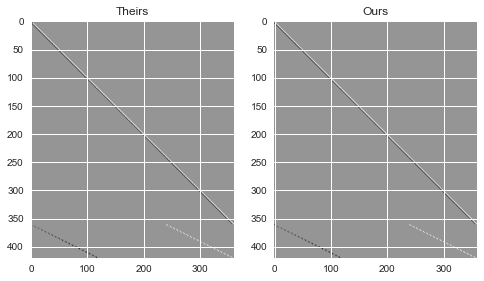

In [10]:
def frobNorm(P1, P2, str1="mat1", str2="mat2"):
    jnp.set_printoptions(suppress=True)
    val = jnp.linalg.norm(P1 - P2, 'fro')
    print(f"Frobenius norm between {str1} and {str2} is: {val}")

print('Jacobian using jax auto differentiation ("theirs") has shape', J_theirs.shape)
print('Jacobian calculated analytically ("ours") has shape', J_ours.shape)
print(frobNorm(J_theirs, J_ours, 'theirs', 'ours'))

fig, ax = plt.subplots(1, 2)
ax[0].imshow(J_theirs)
ax[0].set_title('Theirs')
ax[1].imshow(J_ours)
ax[1].set_title('Ours')
plt.show()

In [53]:
# plot trajectory using matplotlib
def draw_traj(X, Y, THETA):
#     fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(25, 6))
    ax = plt.subplot(111)
    
    gt_poses = read_vertex('dataset/gt.txt')
    gt_poses = gt_poses.T
    
    # Plot Ground truth
    ax.plot(gt_poses[:,0], gt_poses[:,1], 'ro')
    ax.plot(gt_poses[:,0], gt_poses[:,1], 'c-')
    
    for i in range(len(THETA)):
        x2 = 0.25*math.cos(gt_poses[i][3]) + gt_poses[i][0]
        y2 = 0.25*math.sin(gt_poses[i][3]) + gt_poses[i][1]
        plt.plot([gt_poses[i][0], x2], [gt_poses[i][1], y2], 'b->')
    
    # Plot Initial estimate
#     ax.plot(poses[:,0], poses[:,1], 'ro')
#     ax.plot(poses[:,0], poses[:,1], 'c-')
    for i in range(len(THETA)):
        x2 = 0.25*math.cos(poses[i][3]) + poses[i][0]
        y2 = 0.25*math.sin(poses[i][3]) + poses[i][1]
        plt.plot([poses[i][0], x2], [poses[i][1], y2], 'r->')
    
    # Plot optimised trajectory
    ax.plot(X, Y, 'ro')
    ax.plot(X, Y, 'c-')

    for i in range(len(THETA)):
        x2 = 0.25*math.cos(THETA[i]) + X[i]
        y2 = 0.25*math.sin(THETA[i]) + Y[i]
        plt.plot([X[i], x2], [Y[i], y2], 'g->')
        
    plt.show()
    
    
def optimise_lm(poses, edges, anchor, num_iters=NUM_ITERS, lamda=LM_LAMBDA, tol=TOL):
    weights = information_matrix(edges, WEIGHT_ODOMETRY, WEIGHT_LOOP_CLOSURE, WEIGHT_ANCHOR)
    
    poses_history = [poses]
    errors_history = [get_error(poses, edges, weights, anchor), ]

    print('Initial Guess')
    draw_traj(poses[:, 0], poses[:, 1], poses[:, 2])
    
    for _ in range(num_iters):
        new_poses = poses + step_lm(poses, edges, weights, anchor, lamda)
        new_error = get_error(new_poses, edges, weights, anchor)
        print('ITER', _, 'ERROR', new_error)
        draw_traj(new_poses[:, 0], new_poses[:, 1], new_poses[:, 2])

        if len(errors_history) > 0:
            if (new_error > errors_history[-1]):
                lamda = lamda * 2
            else:
                lamda = lamda / 3
                
        errors_history.append(new_error)
        poses_history.append(new_poses)
        
        if jnp.linalg.norm(new_poses - poses) < tol:
            break
        poses = new_poses
        
    return poses_history, errors_history

Initial Guess


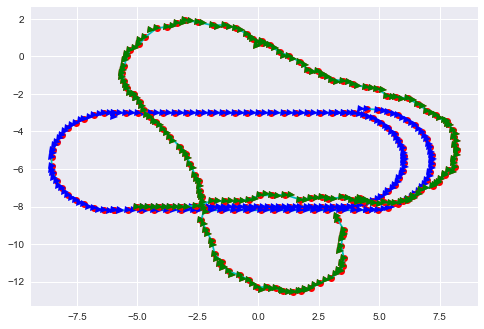

ITER 0 ERROR 112500.27


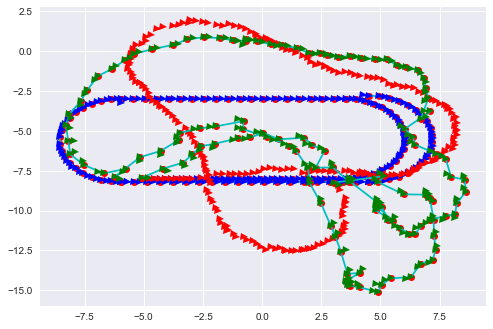

ITER 1 ERROR 3217.5251


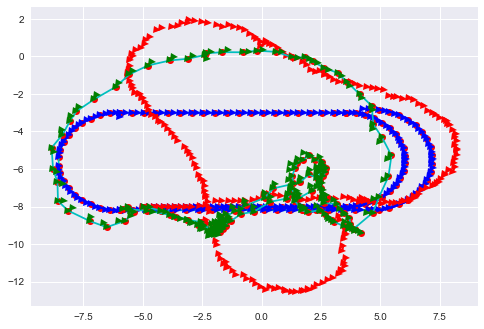

ITER 2 ERROR 3099.755


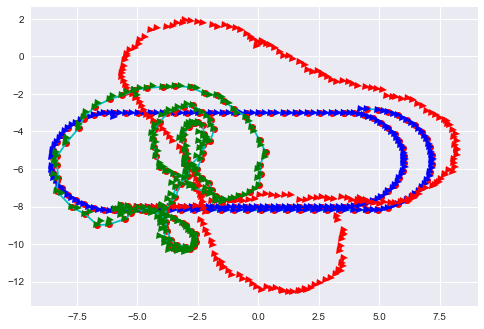

ITER 3 ERROR 4870.533


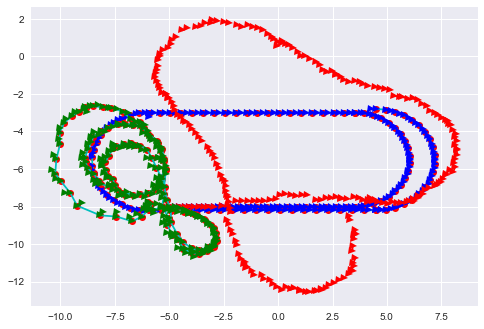

ITER 4 ERROR 6832.663


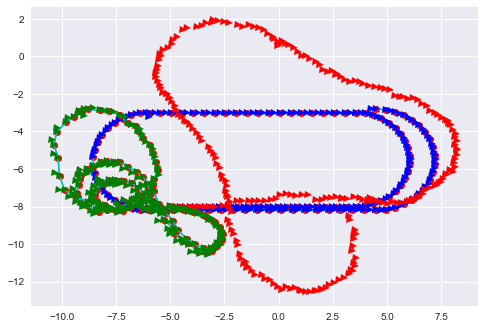

ITER 5 ERROR 8665.264


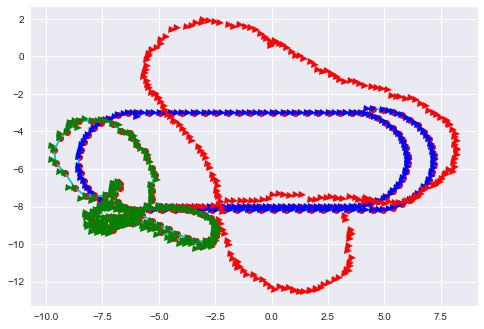

ITER 6 ERROR 5185.8286


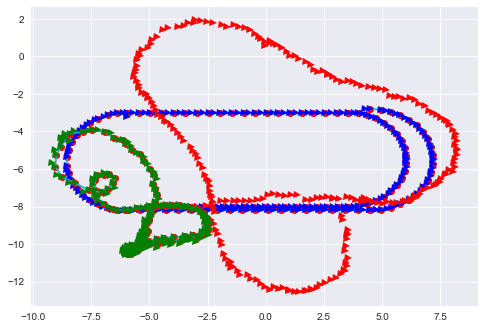

ITER 7 ERROR 866.92206


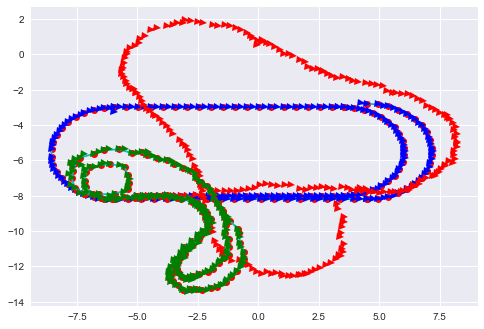

ITER 8 ERROR 306.04977


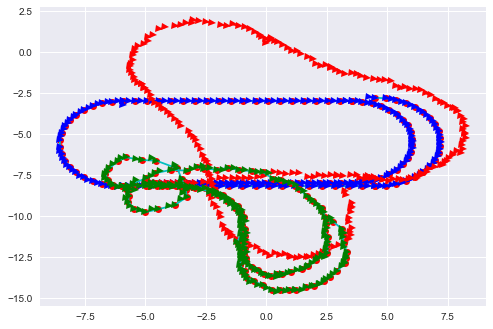

ITER 9 ERROR 292.96432


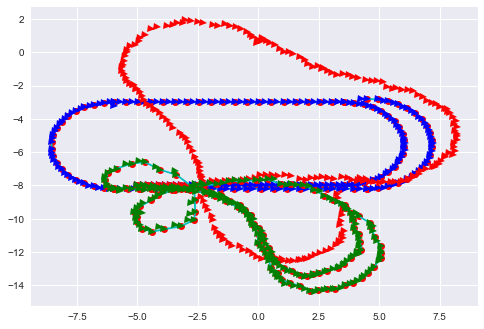

ITER 10 ERROR 250.87001


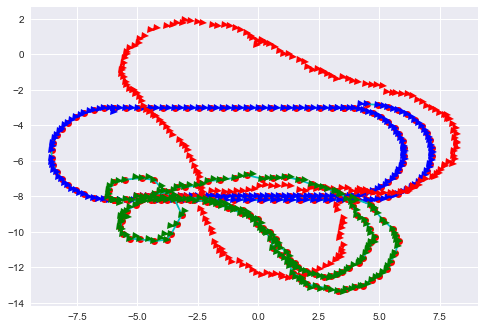

ITER 11 ERROR 231.58806


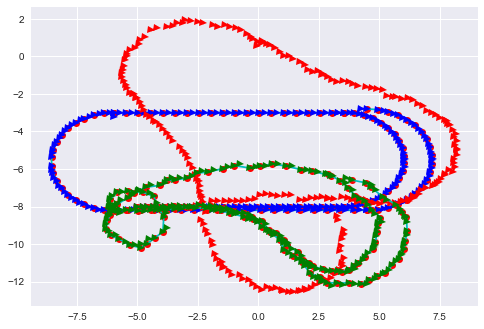

ITER 12 ERROR 204.40848


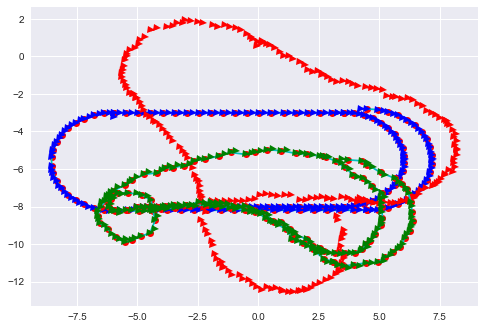

ITER 13 ERROR 171.44733


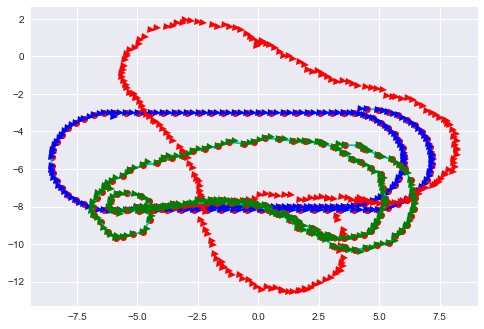

ITER 14 ERROR 154.77069


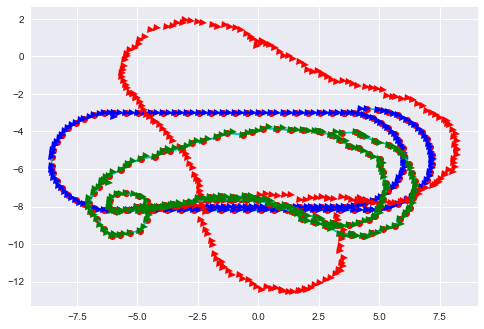

ITER 15 ERROR 150.25911


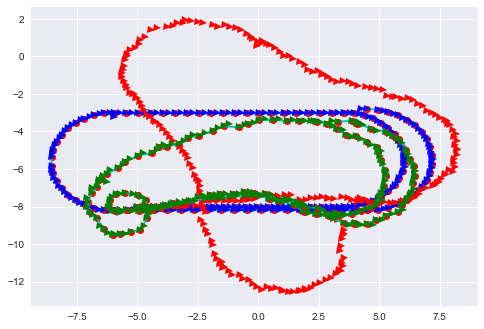

ITER 16 ERROR 152.32483


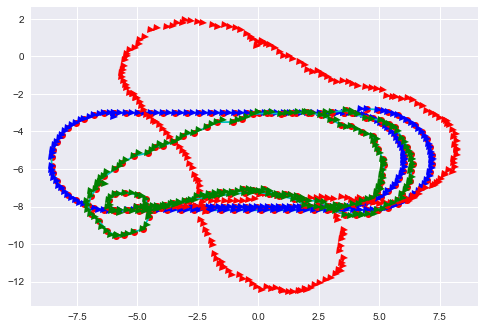

ITER 17 ERROR 159.84192


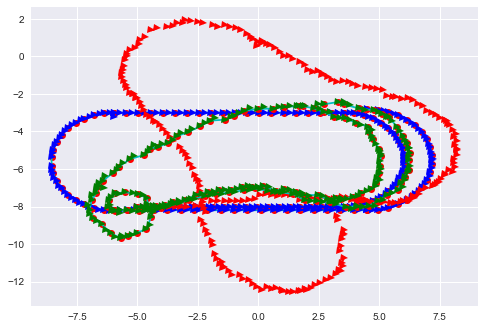

ITER 18 ERROR 170.6514


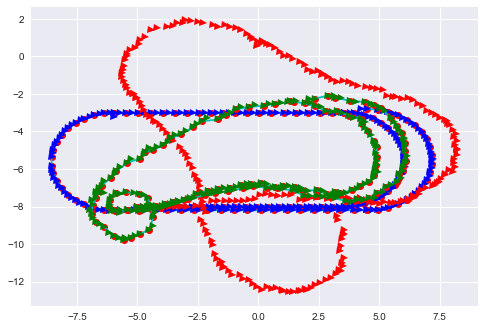

ITER 19 ERROR 178.71204


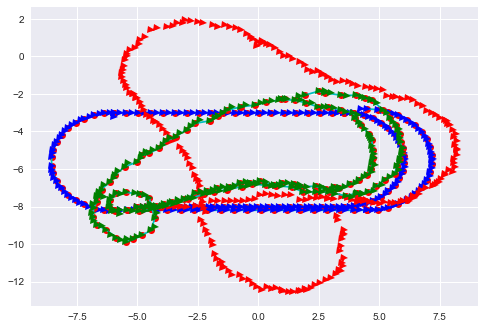

ITER 20 ERROR 176.86197


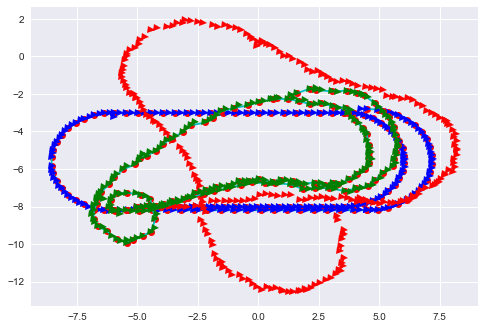

ITER 21 ERROR 163.38196


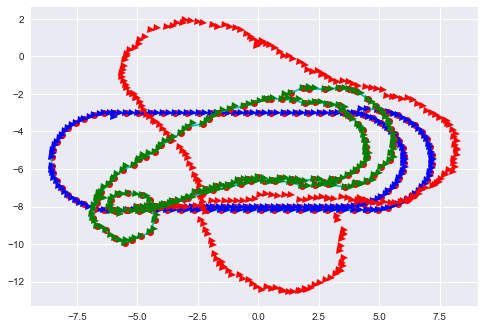

ITER 22 ERROR 146.80133


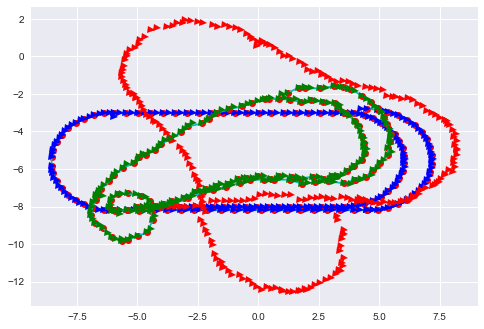

ITER 23 ERROR 140.0748


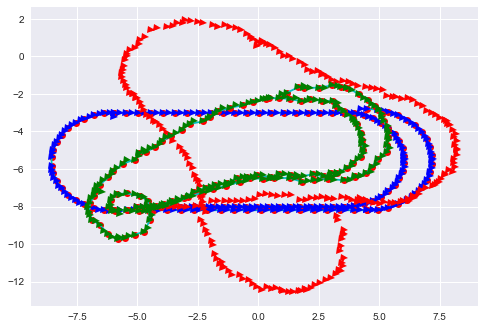

ITER 24 ERROR 143.63885


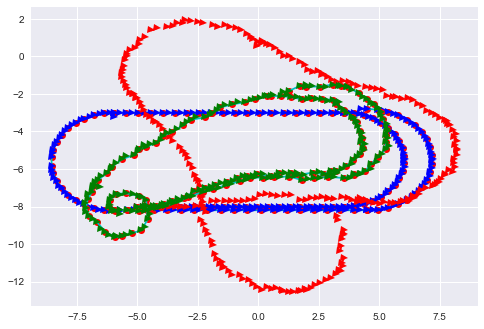

ITER 25 ERROR 143.79318


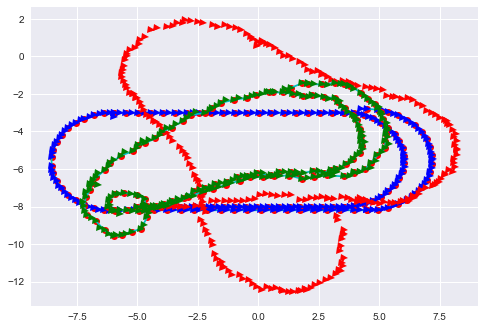

ITER 26 ERROR 135.93063


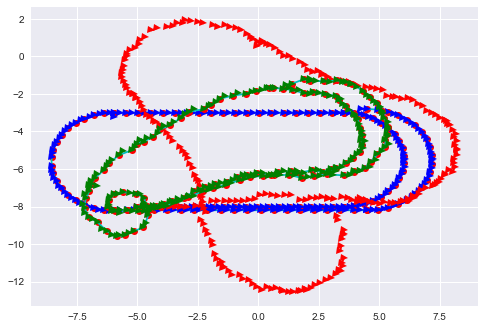

ITER 27 ERROR 134.57094


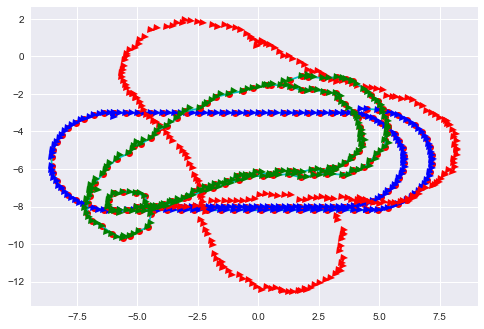

ITER 28 ERROR 155.04572


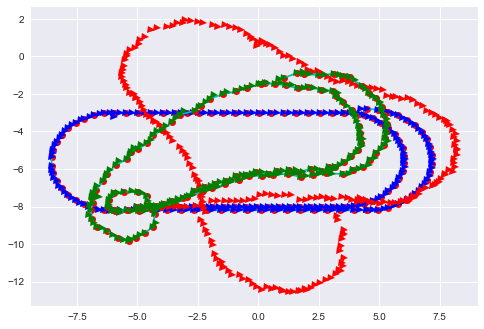

ITER 29 ERROR 195.50607


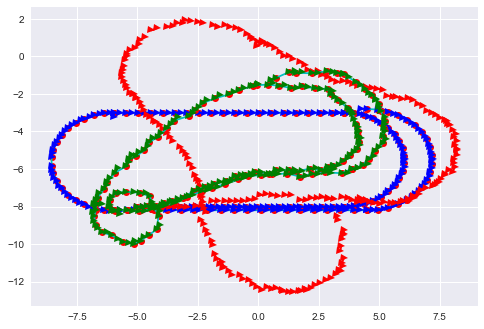

ITER 30 ERROR 231.82898


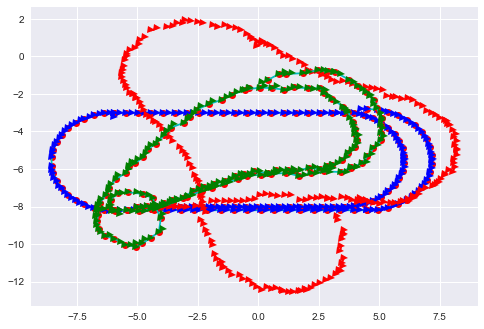

ITER 31 ERROR 227.8311


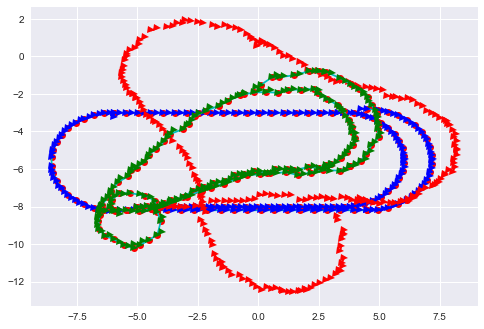

ITER 32 ERROR 179.99808


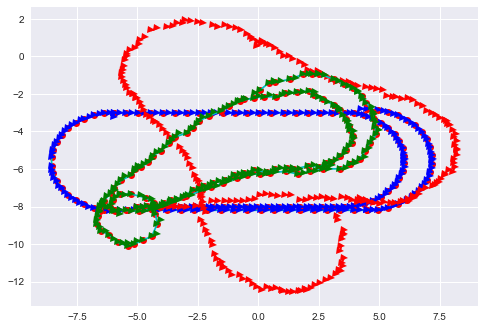

ITER 33 ERROR 177.09343


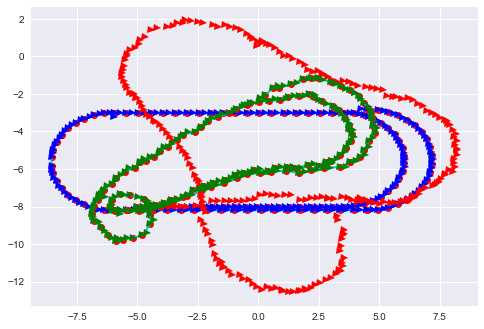

ITER 34 ERROR 300.812


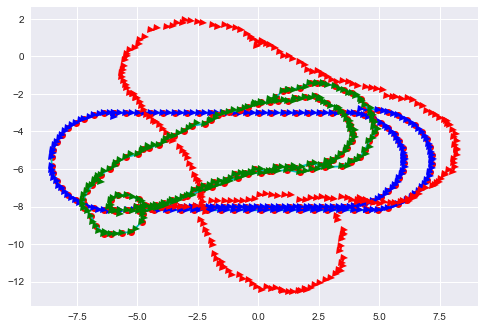

ITER 35 ERROR 386.65836


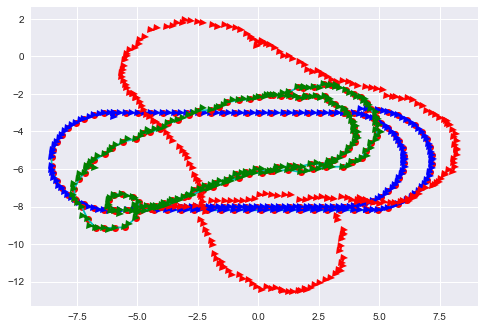

ITER 36 ERROR 280.99252


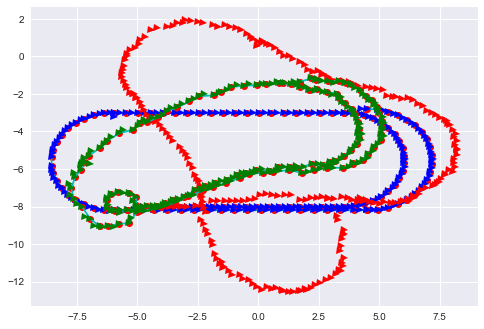

ITER 37 ERROR 161.0345


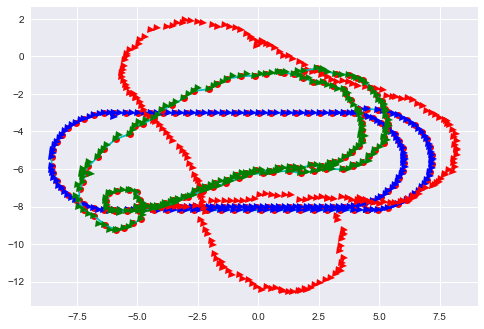

ITER 38 ERROR 191.85977


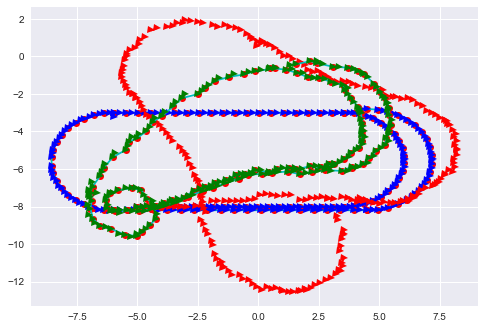

ITER 39 ERROR 420.13934


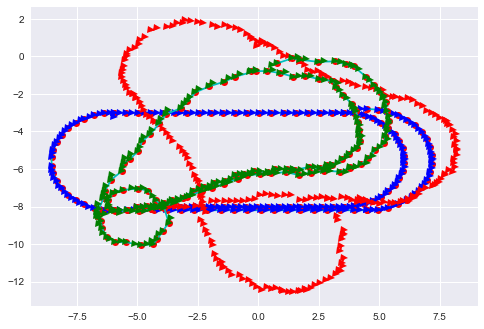

ITER 40 ERROR 868.34735


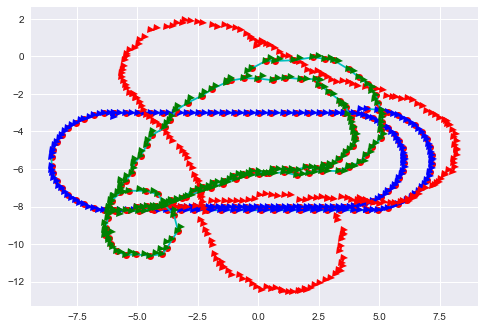

ITER 41 ERROR 1477.8717


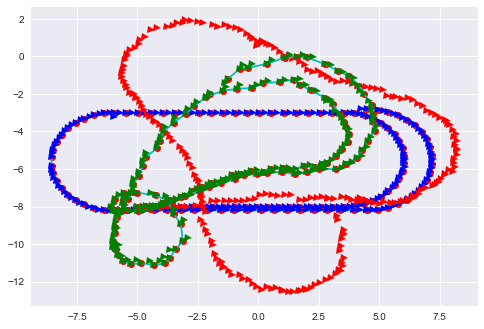

ITER 42 ERROR 1830.9924


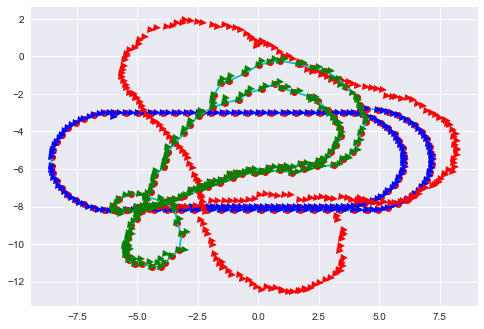

ITER 43 ERROR 1107.5983


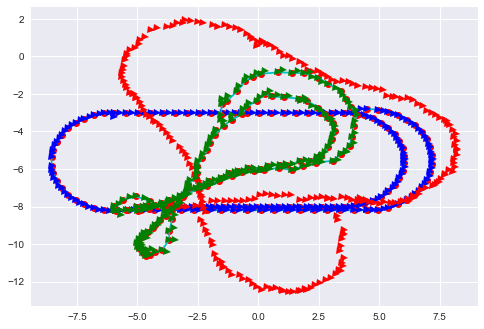

ITER 44 ERROR 399.26324


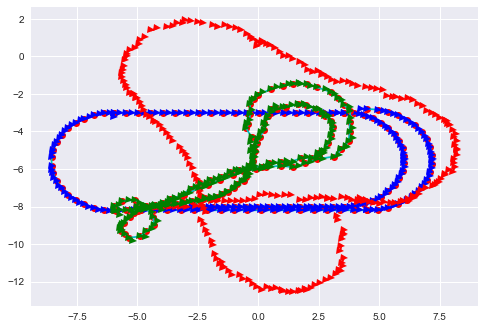

ITER 45 ERROR 2620.6062


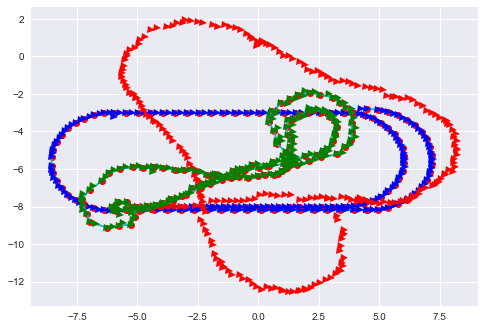

ITER 46 ERROR 4403.573


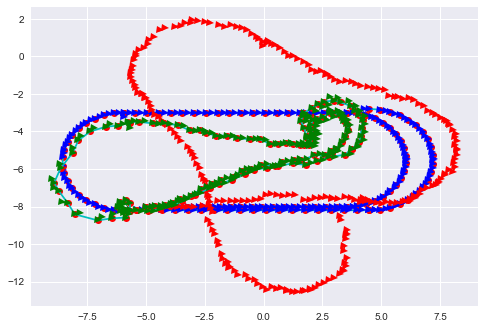

ITER 47 ERROR 2144.1167


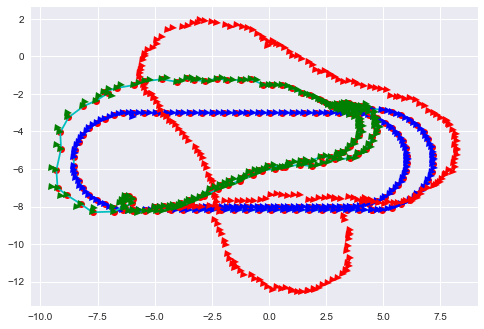

ITER 48 ERROR 512.4918


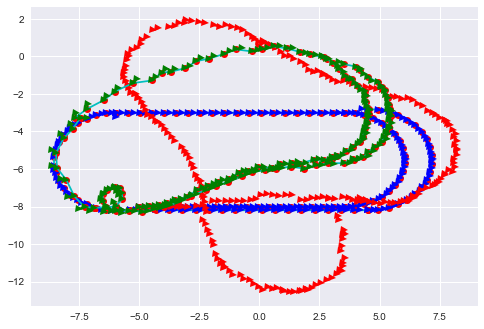

ITER 49 ERROR 282.51306


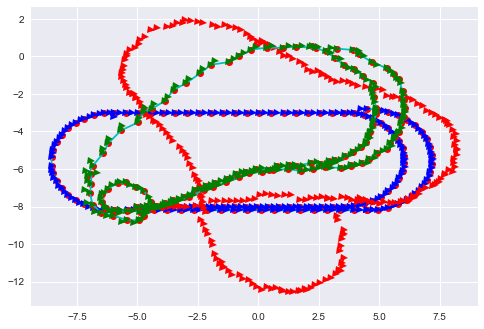

ITER 50 ERROR 735.9198


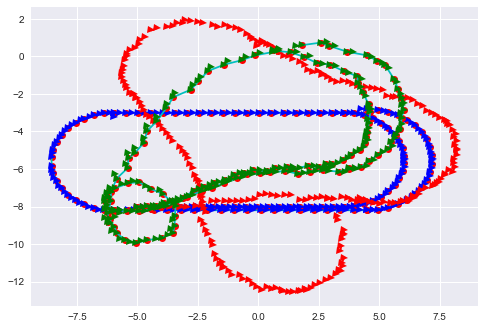

ITER 51 ERROR 2203.6907


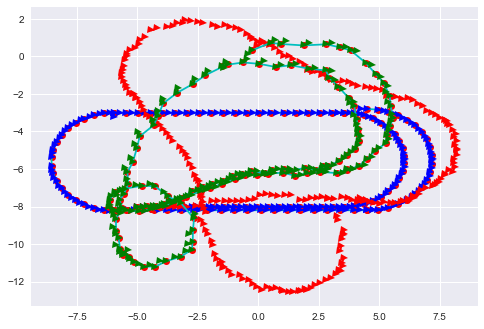

ITER 52 ERROR 5909.991


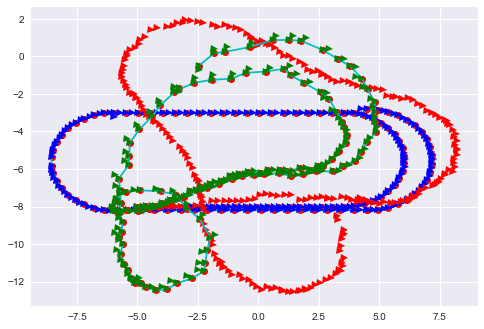

ITER 53 ERROR 13922.625


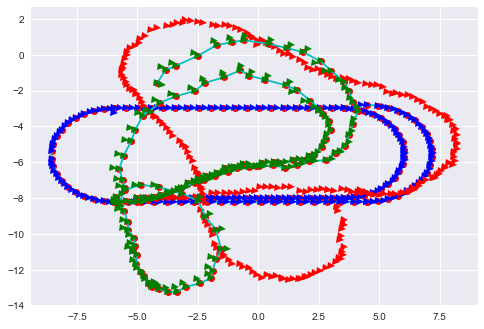

ITER 54 ERROR 18167.62


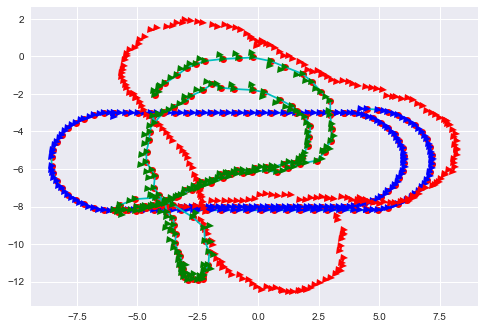

ITER 55 ERROR 6749.698


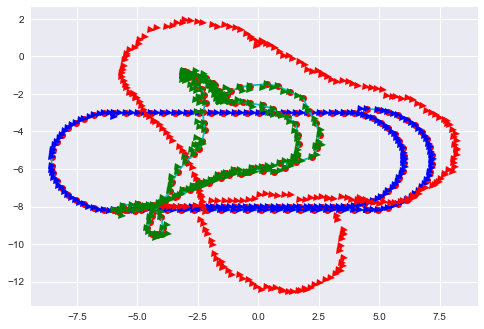

ITER 56 ERROR 3416.4722


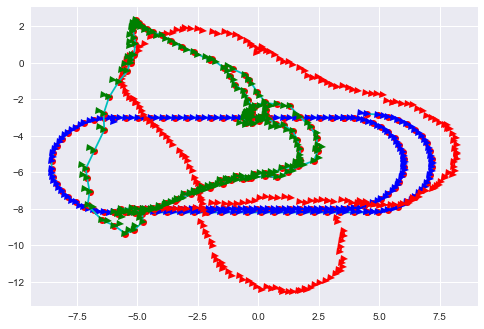

ITER 57 ERROR 2776.081


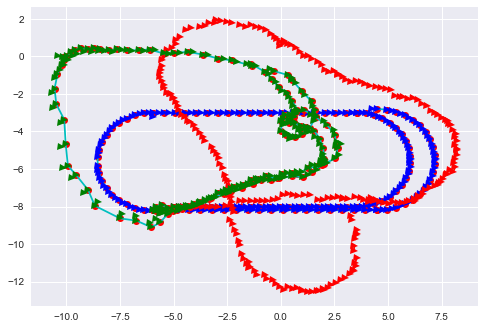

ITER 58 ERROR 1086.5214


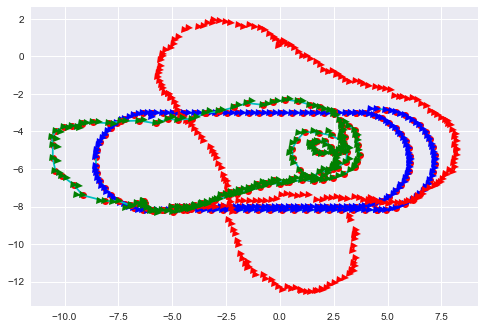

ITER 59 ERROR 4404.4844


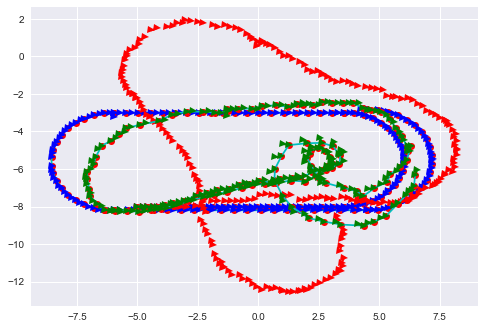

ITER 60 ERROR 4431.727


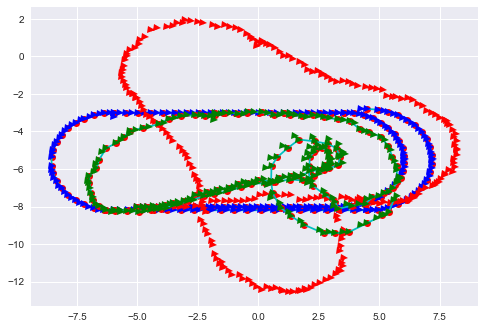

ITER 61 ERROR 3743.7004


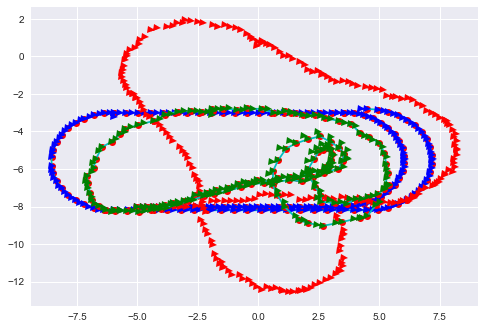

ITER 62 ERROR 2340.2349


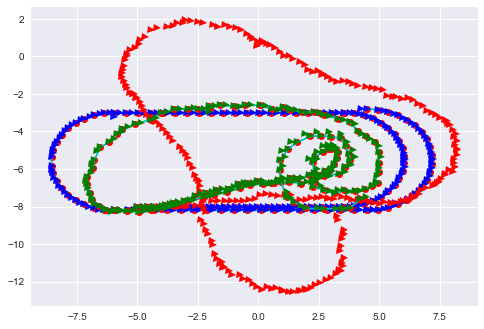

ITER 63 ERROR 1162.6266


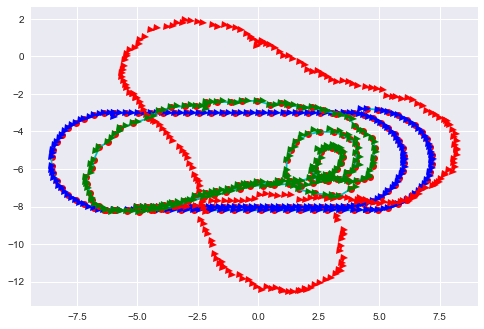

ITER 64 ERROR 498.47488


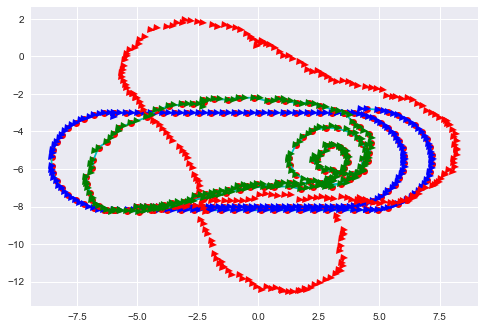

ITER 65 ERROR 252.72264


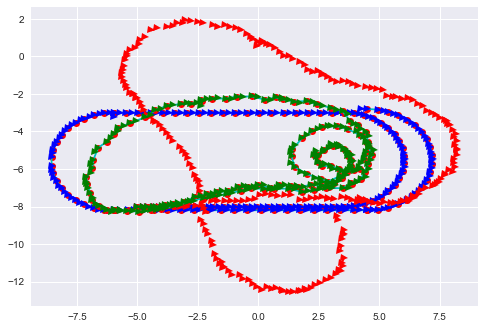

ITER 66 ERROR 187.9609


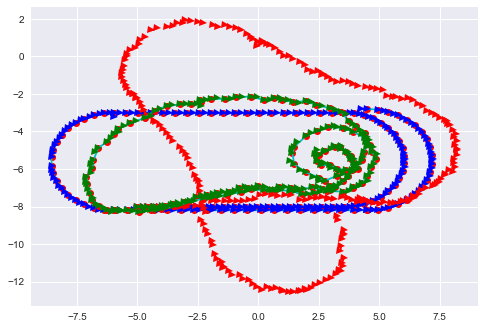

ITER 67 ERROR 173.2876


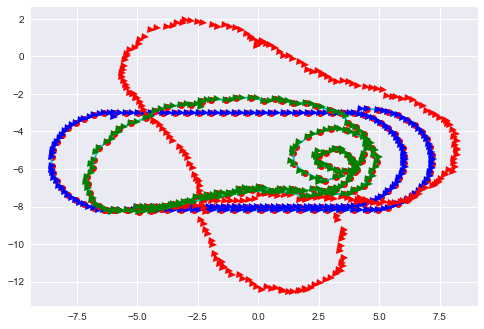

ITER 68 ERROR 169.70593


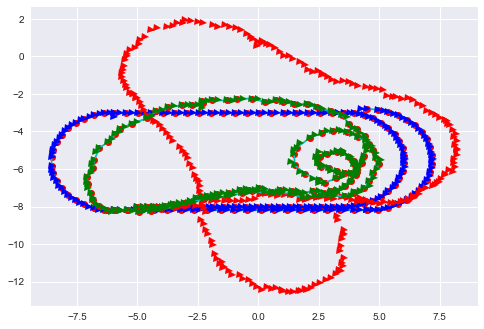

ITER 69 ERROR 168.54562


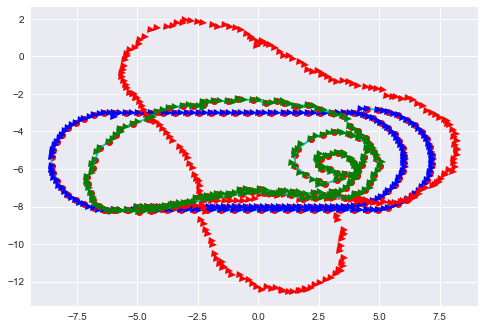

ITER 70 ERROR 168.0027


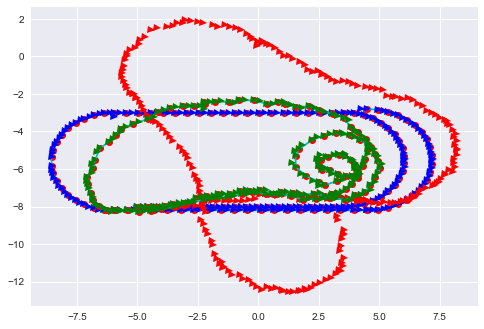

ITER 71 ERROR 167.68295


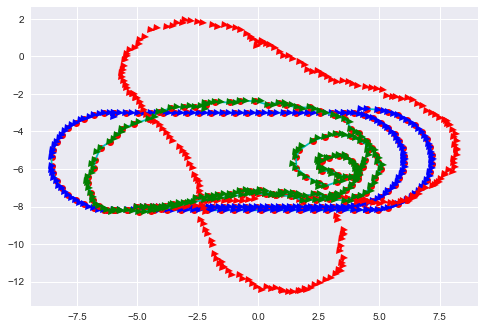

ITER 72 ERROR 167.48041


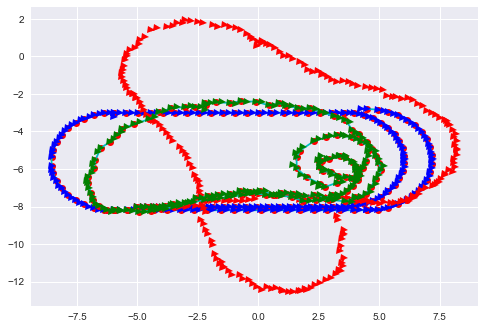

ITER 73 ERROR 167.35075


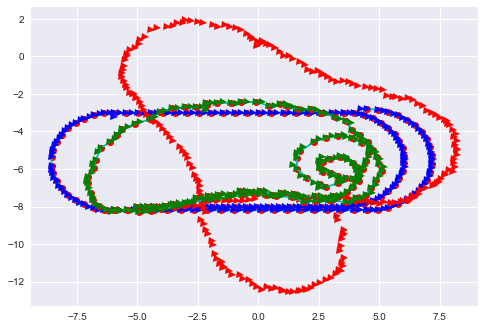

ITER 74 ERROR 167.26822


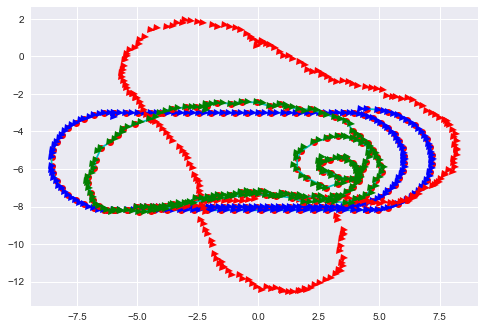

ITER 75 ERROR 167.21564


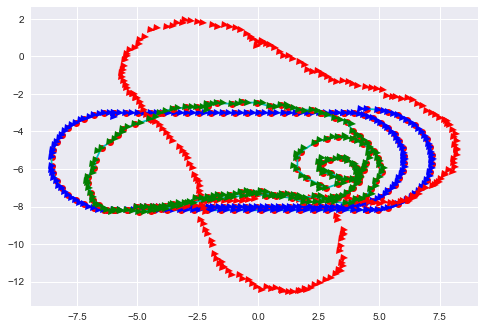

ITER 76 ERROR 167.18259


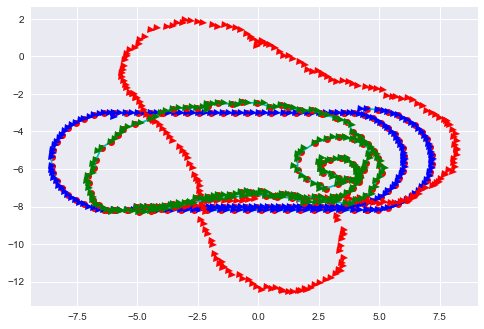

ITER 77 ERROR 167.16154


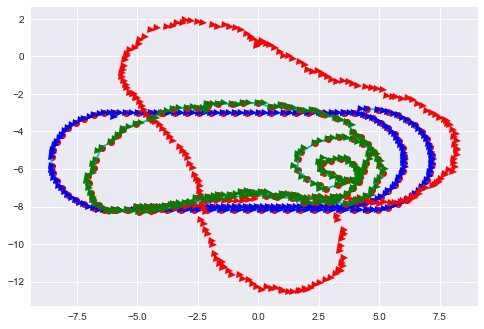

ITER 78 ERROR 167.14825


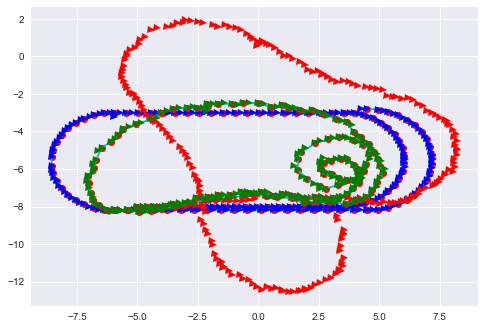

ITER 79 ERROR 167.14006


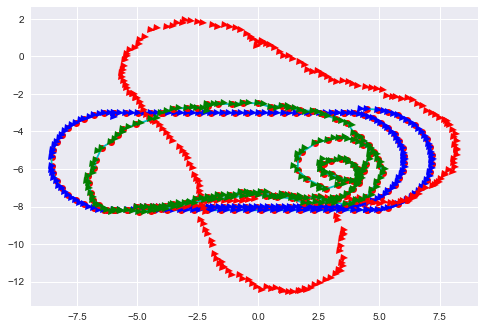

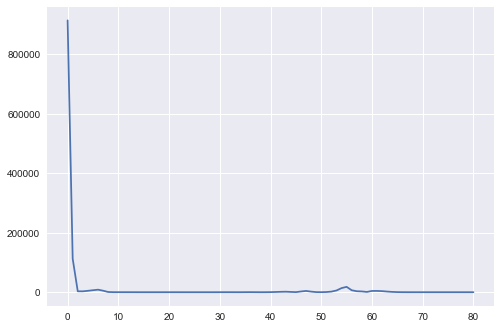

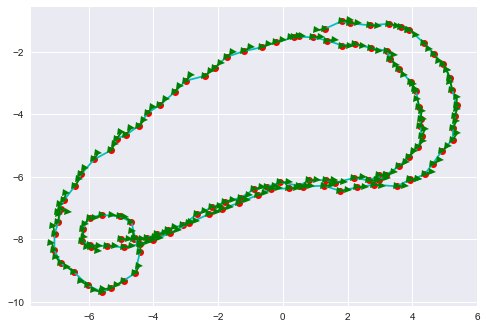

CPU times: user 21min 46s, sys: 3min 9s, total: 24min 56s
Wall time: 17min 15s


In [55]:
%%time
poses_history, errors_history = optimise_lm(poses, edges, anchor, num_iters = 80)
plt.plot(errors_history)
plt.show()
best = jnp.argmin(jnp.asarray(errors_history))
draw(poses_history[best][:, 0], poses_history[best][:, 1], poses_history[best][:, 2])
write_poses(poses_history[best], 'opt.g2o')

Initial Guess


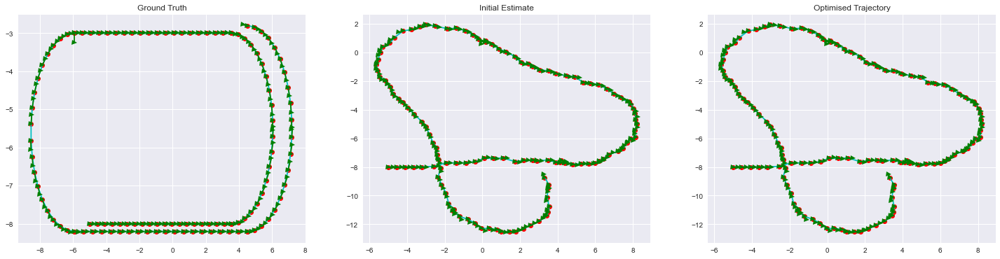

ITER 0 ERROR 112500.27


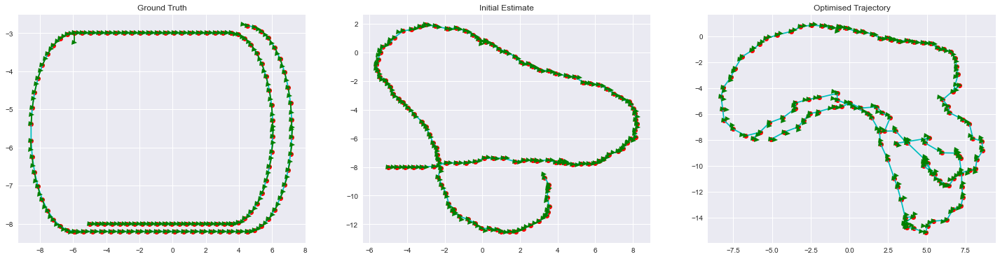

ITER 1 ERROR 3217.5251


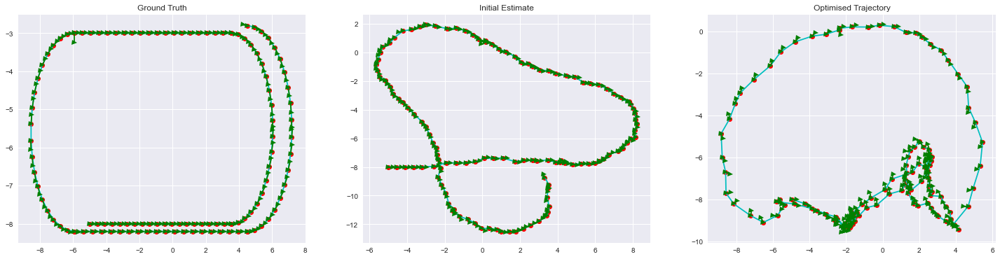

ITER 2 ERROR 3099.755


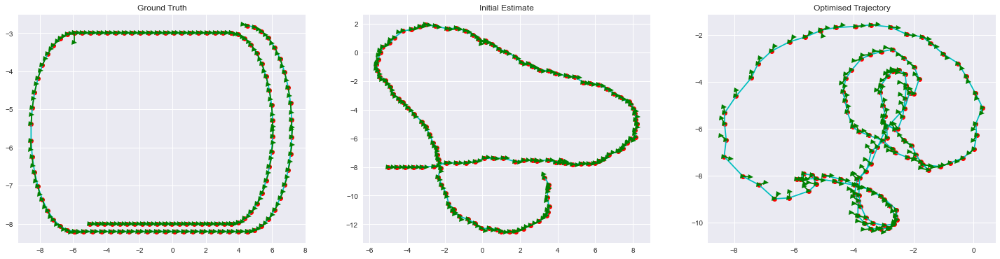

ITER 3 ERROR 4870.533


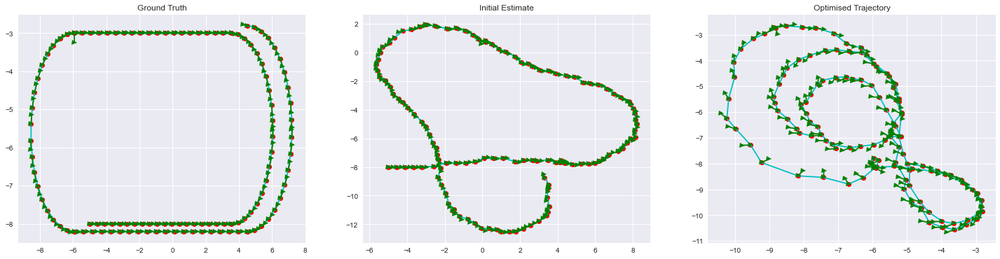

ITER 4 ERROR 6832.663


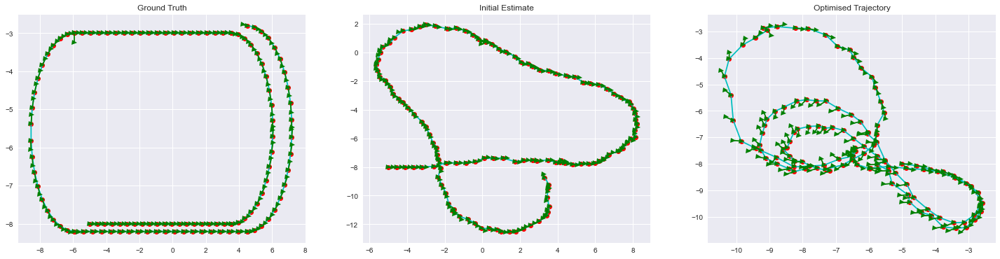

ITER 5 ERROR 8665.264


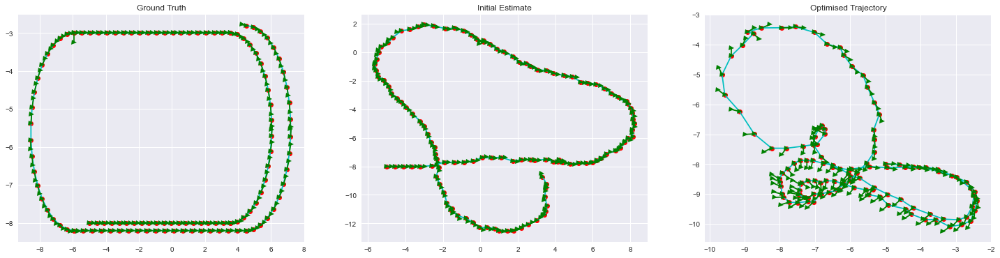

ITER 6 ERROR 5185.8286


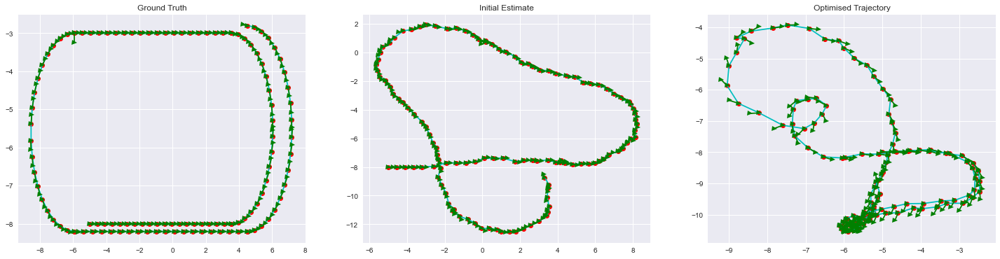

ITER 7 ERROR 866.92206


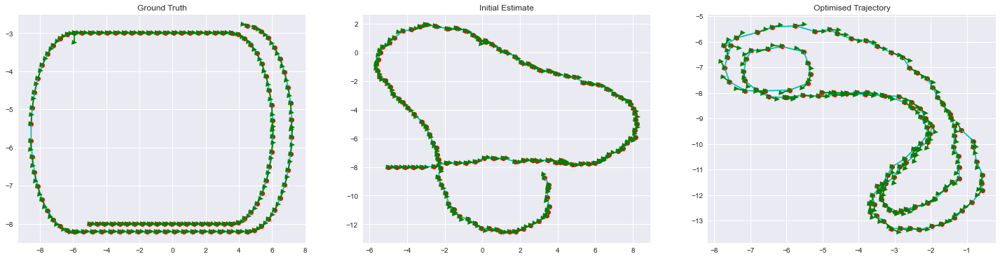

ITER 8 ERROR 306.04977


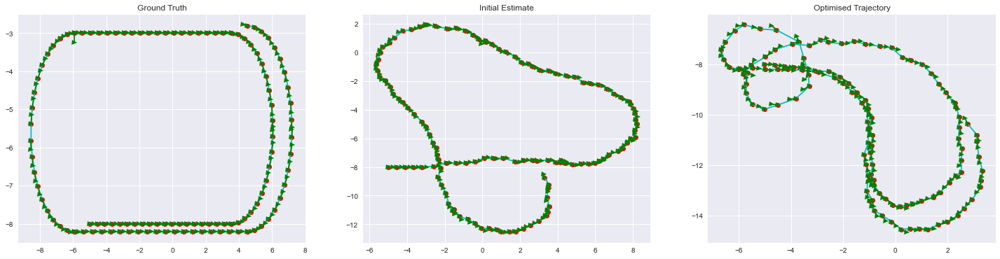

ITER 9 ERROR 292.96432


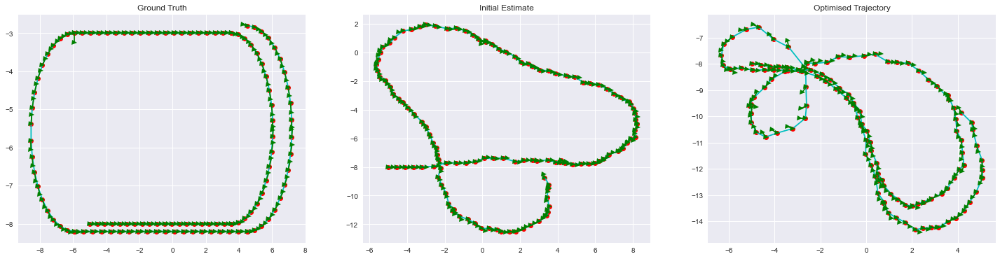

ITER 10 ERROR 250.87001


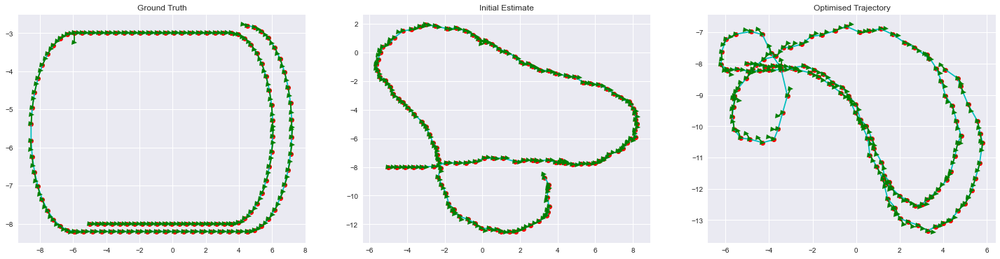

ITER 11 ERROR 231.58806


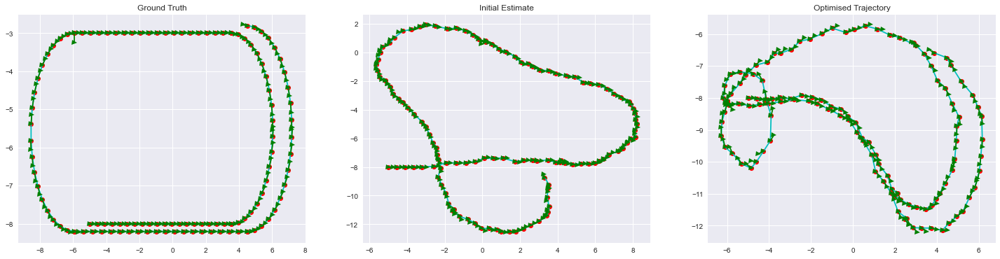

ITER 12 ERROR 204.40848


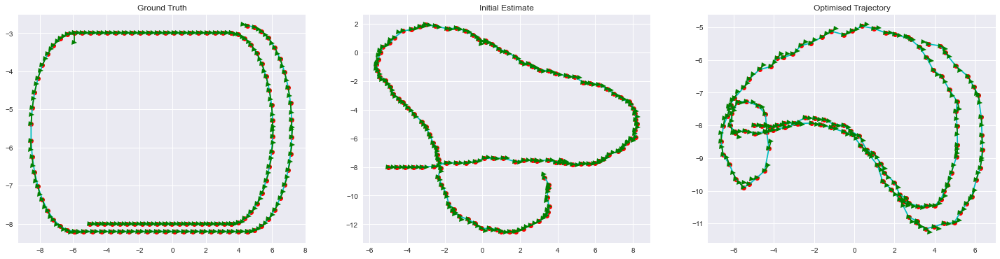

ITER 13 ERROR 171.44733


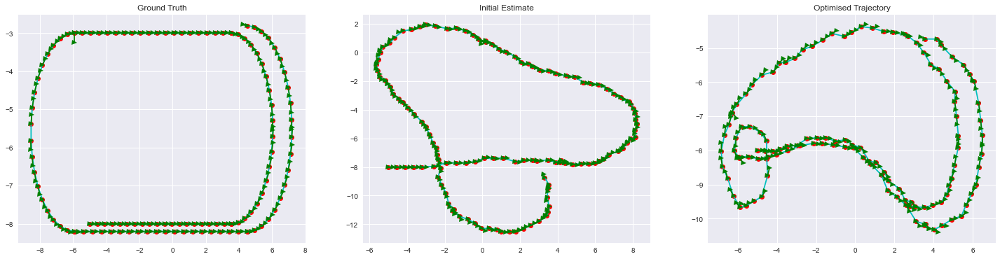

ITER 14 ERROR 154.77069


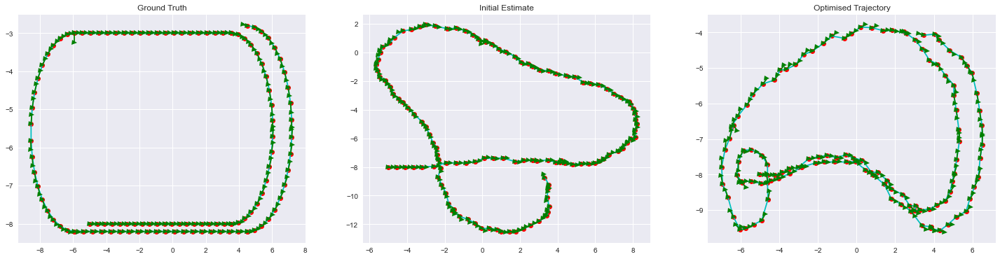

ITER 15 ERROR 150.25911


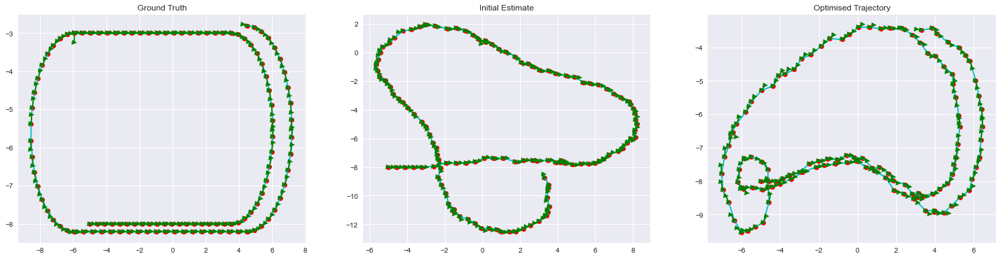

ITER 16 ERROR 152.32483


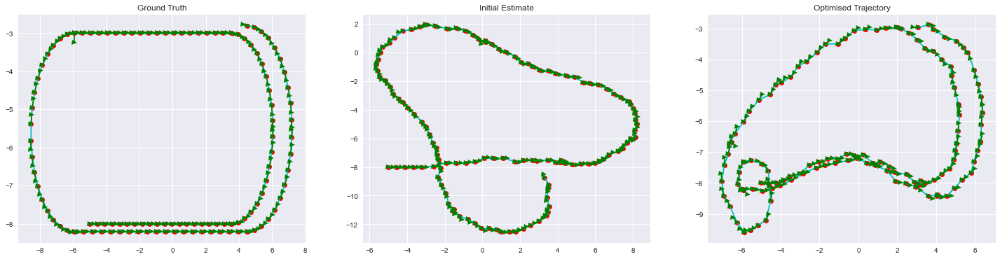

ITER 17 ERROR 159.84192


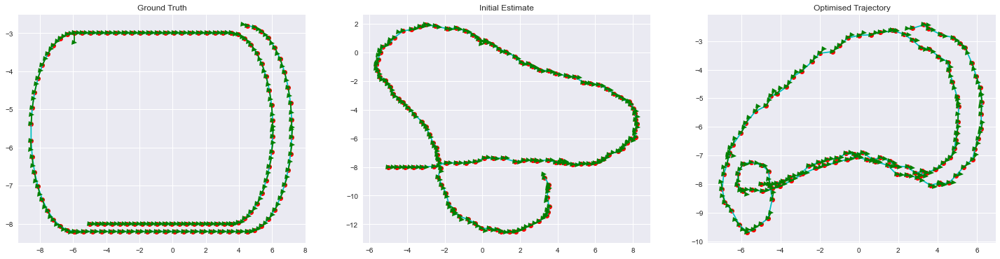

ITER 18 ERROR 170.6514


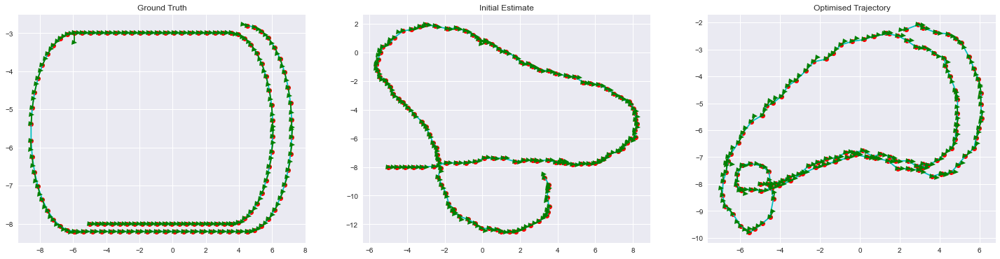

ITER 19 ERROR 178.71204


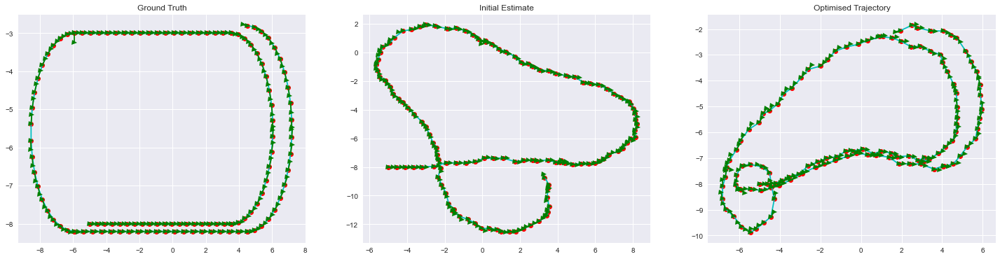

ITER 20 ERROR 176.86197


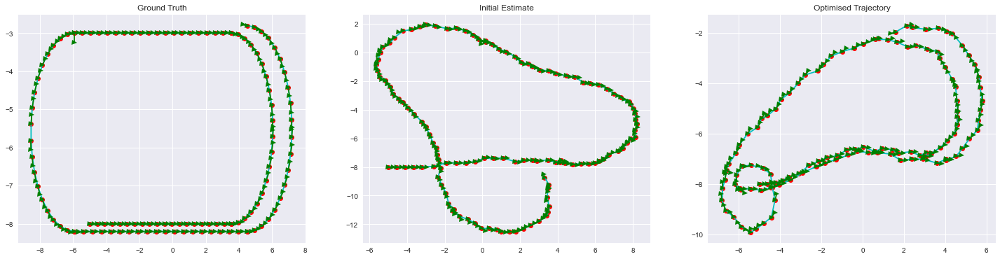

ITER 21 ERROR 163.38196


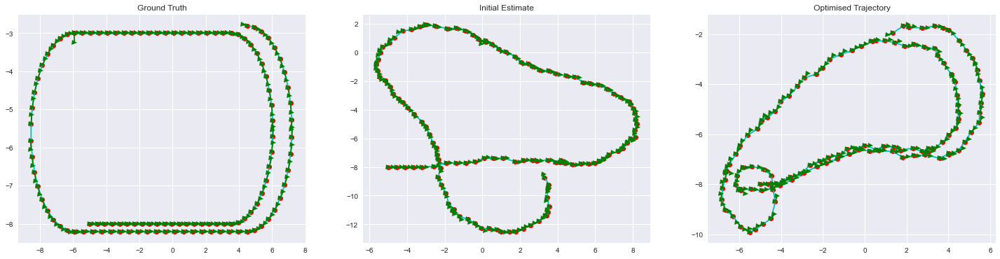

ITER 22 ERROR 146.80133


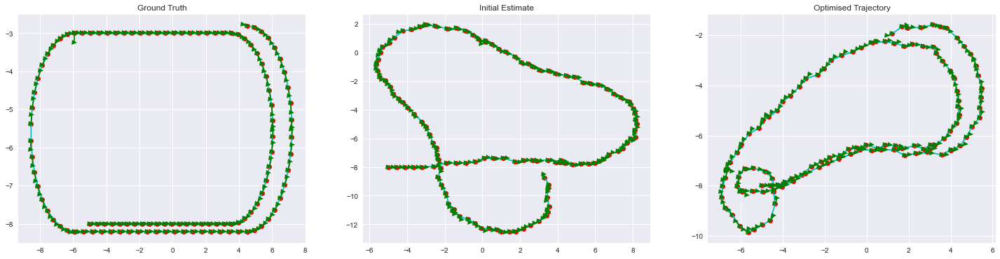

ITER 23 ERROR 140.0748


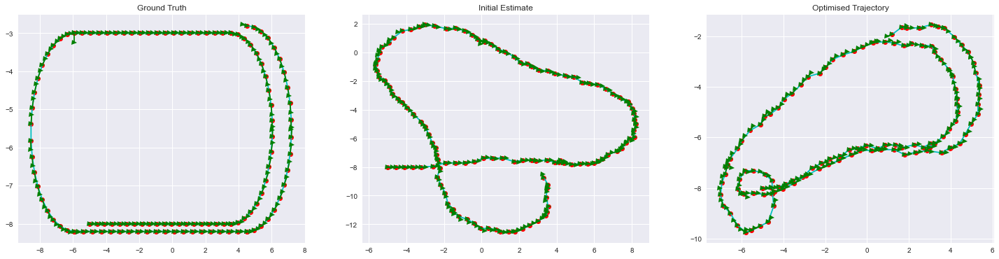

ITER 24 ERROR 143.63885


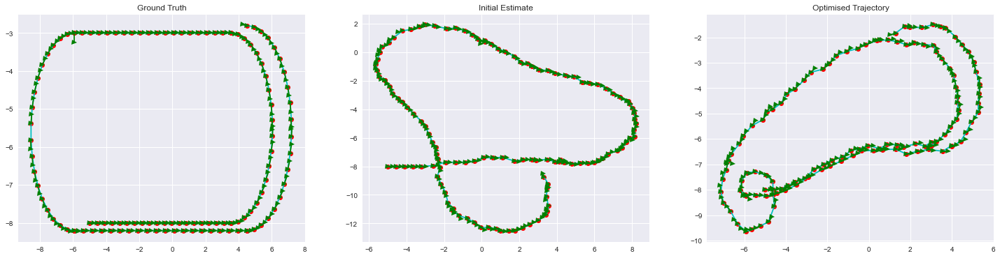

ITER 25 ERROR 143.79318


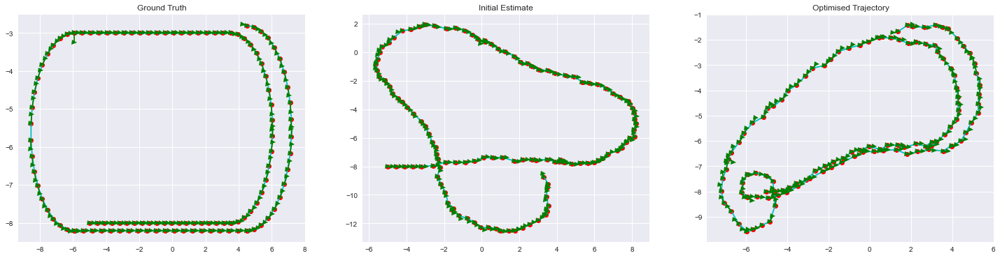

ITER 26 ERROR 135.93063


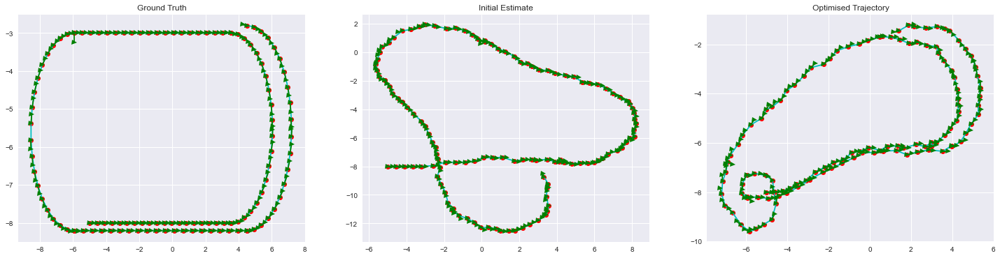

ITER 27 ERROR 134.57094


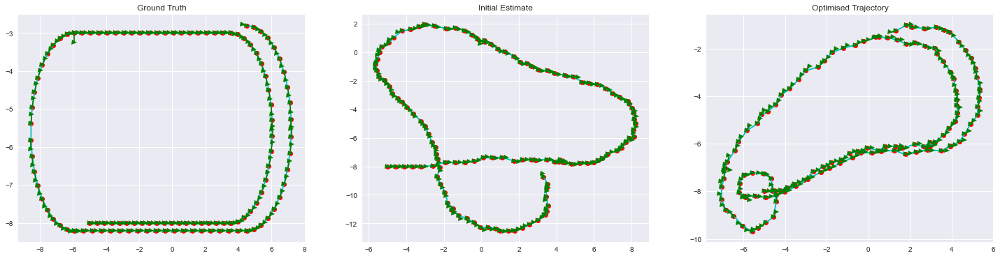

ITER 28 ERROR 155.04572


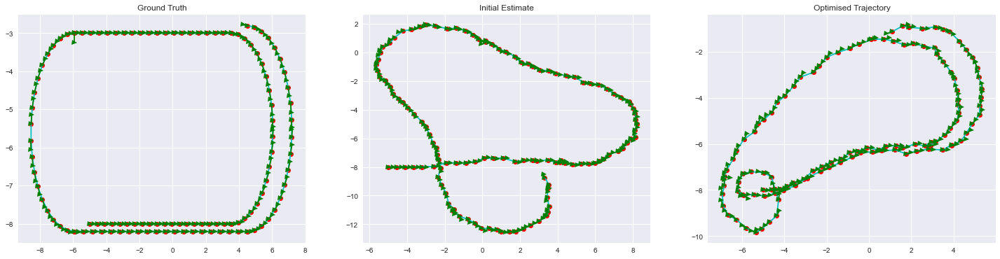

ITER 29 ERROR 195.50607


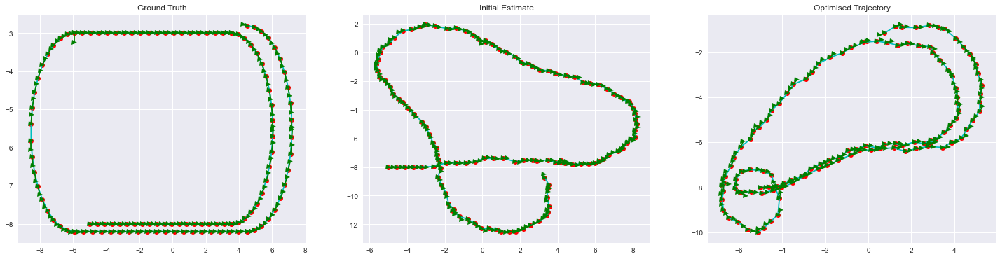

ITER 30 ERROR 231.82898


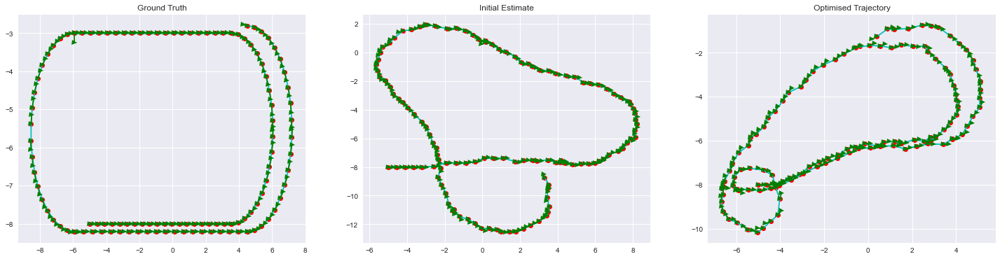

ITER 31 ERROR 227.8311


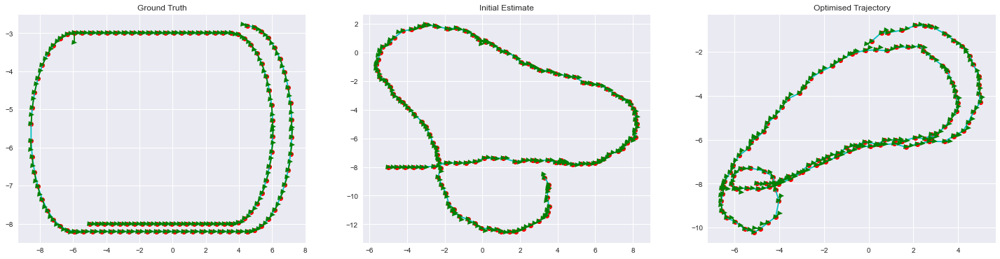

ITER 32 ERROR 179.99808


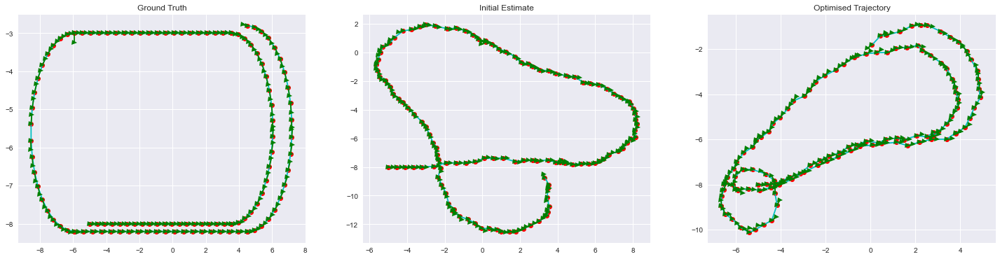

ITER 33 ERROR 177.09343


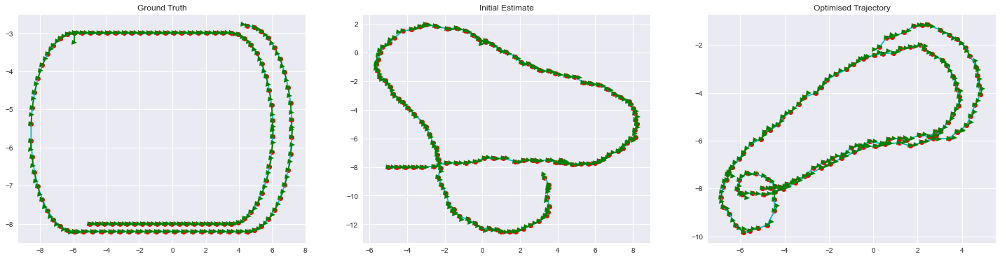

ITER 34 ERROR 300.812


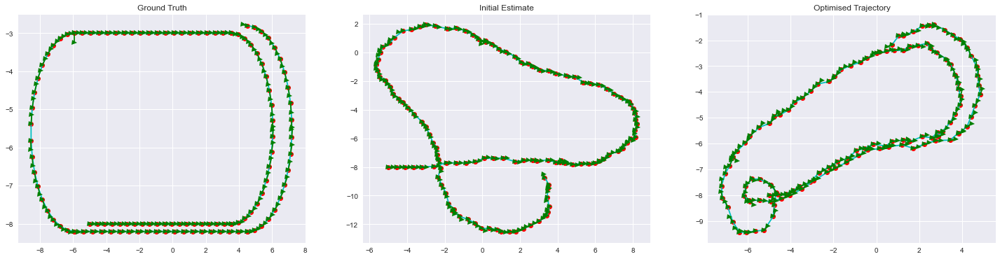

ITER 35 ERROR 386.65836


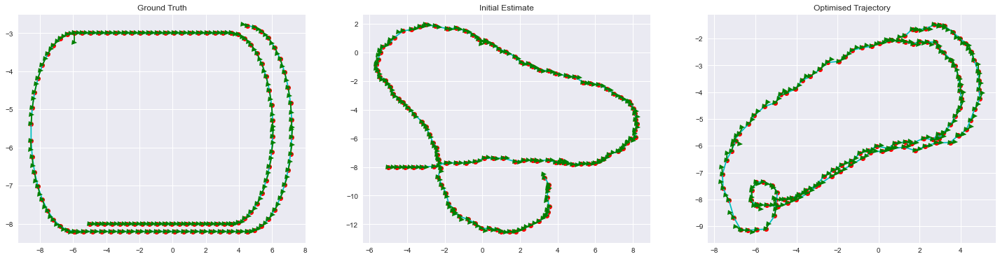

ITER 36 ERROR 280.99252


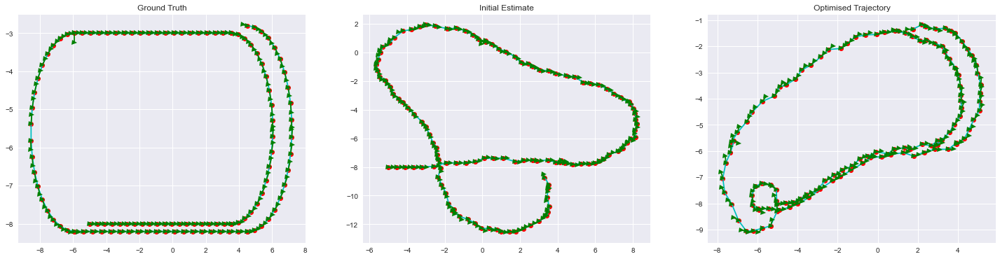

ITER 37 ERROR 161.0345


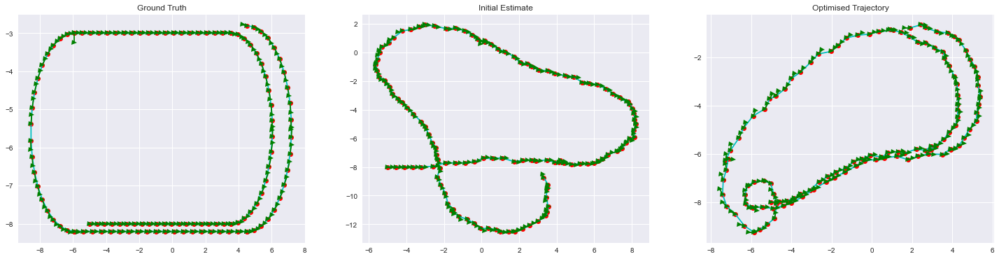

ITER 38 ERROR 191.85977


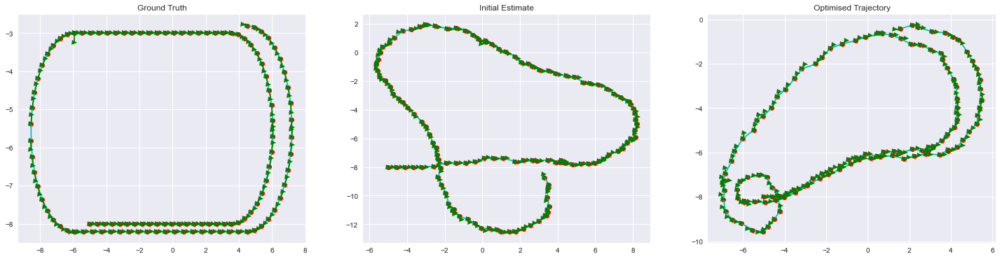

ITER 39 ERROR 420.13934


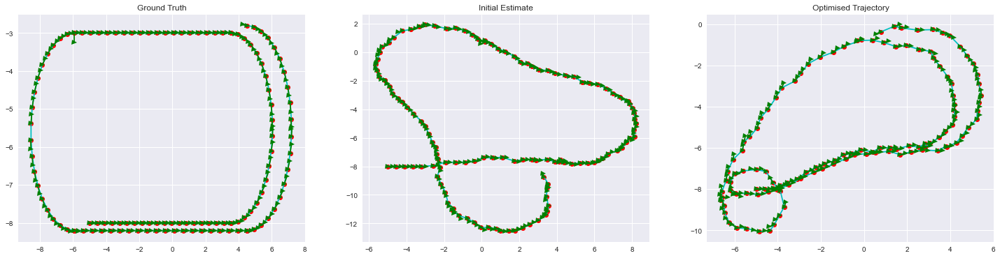

ITER 40 ERROR 868.34735


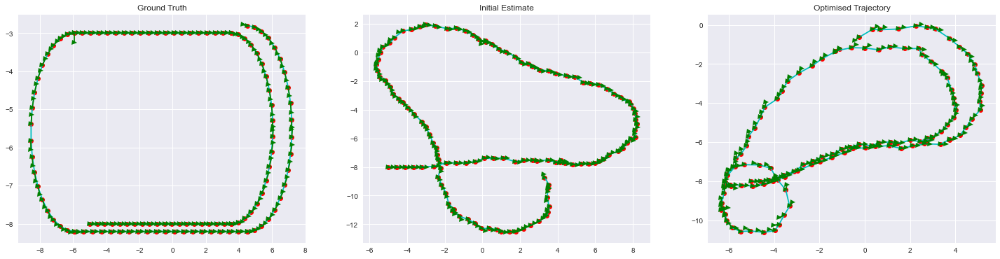

ITER 41 ERROR 1477.8717


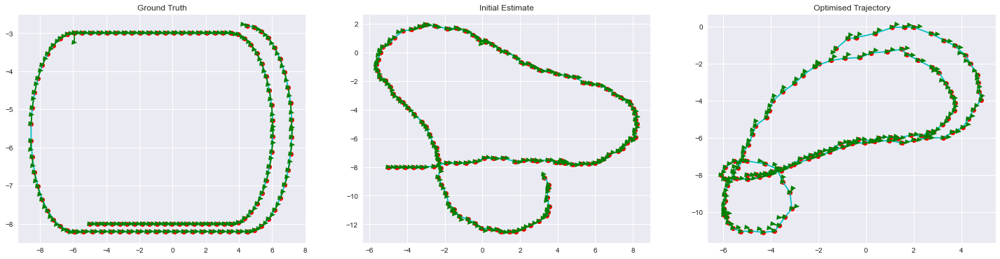

ITER 42 ERROR 1830.9924


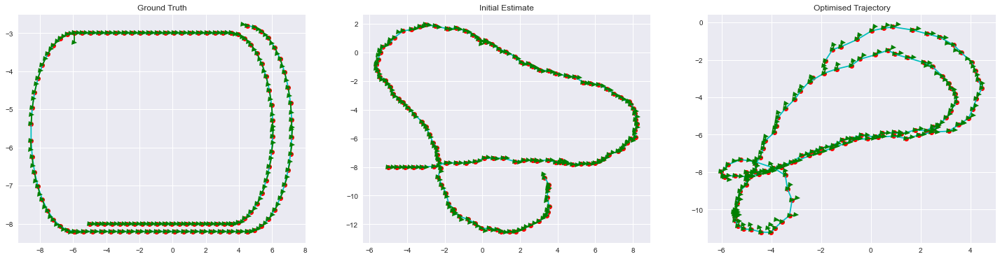

ITER 43 ERROR 1107.5983


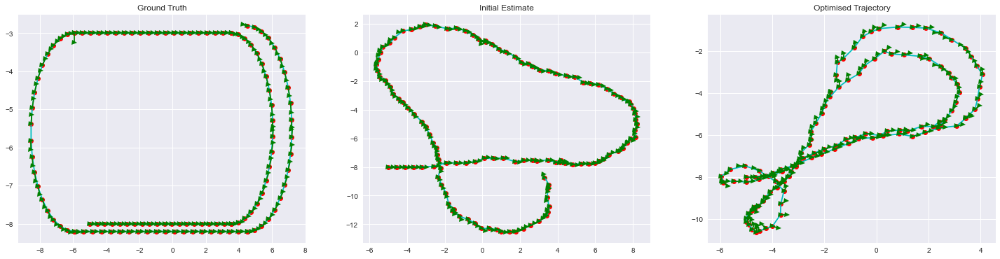

ITER 44 ERROR 399.26324


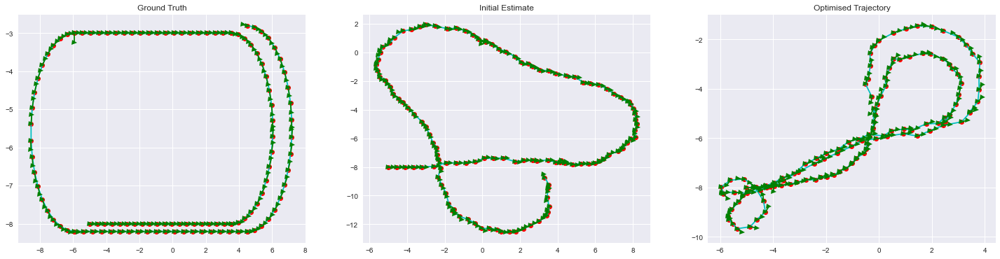

ITER 45 ERROR 2620.6062


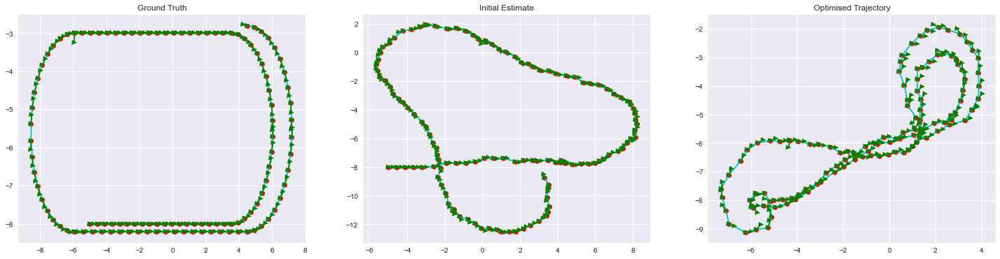

ITER 46 ERROR 4403.573


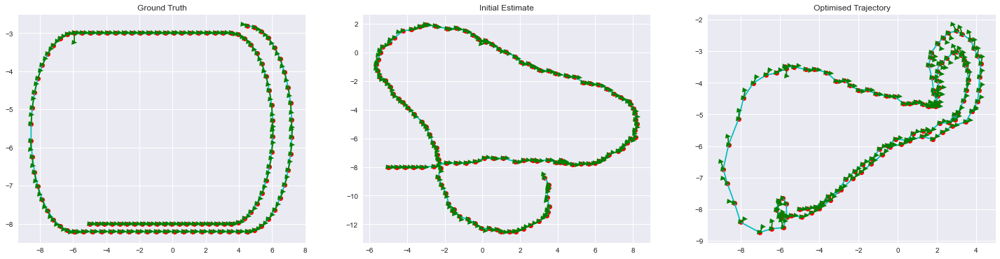

ITER 47 ERROR 2144.1167


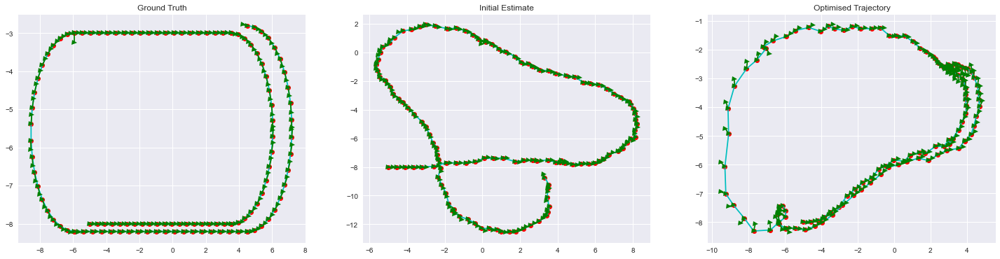

ITER 48 ERROR 512.4918


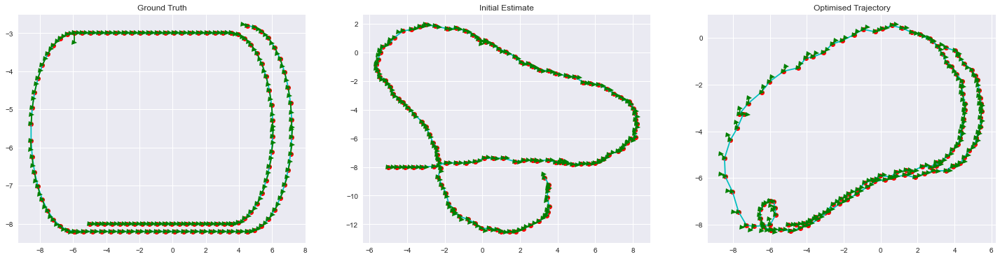

ITER 49 ERROR 282.51306


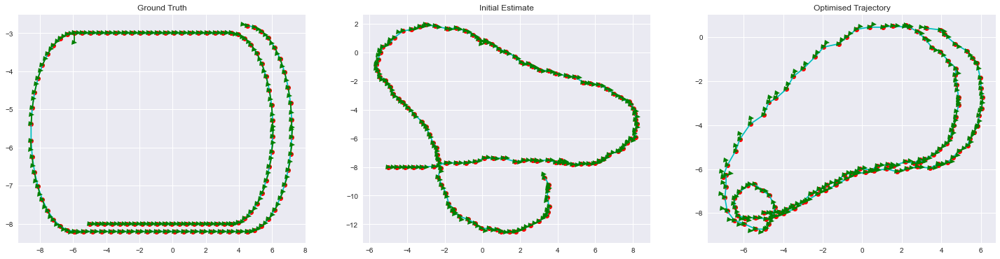

ITER 50 ERROR 735.9198


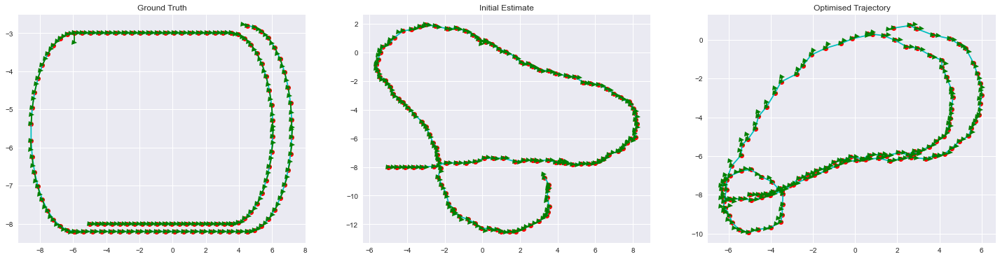

ITER 51 ERROR 2203.6907


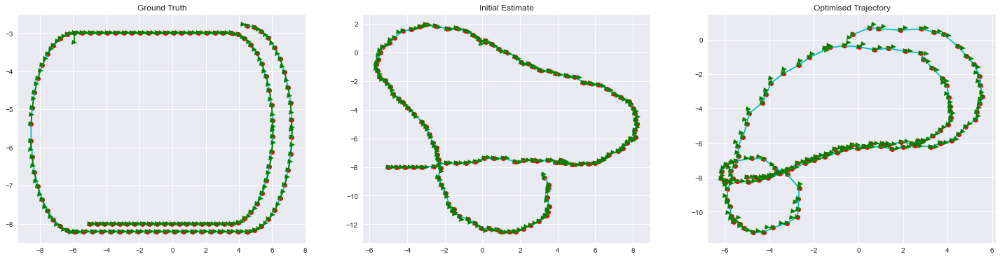

ITER 52 ERROR 5909.991


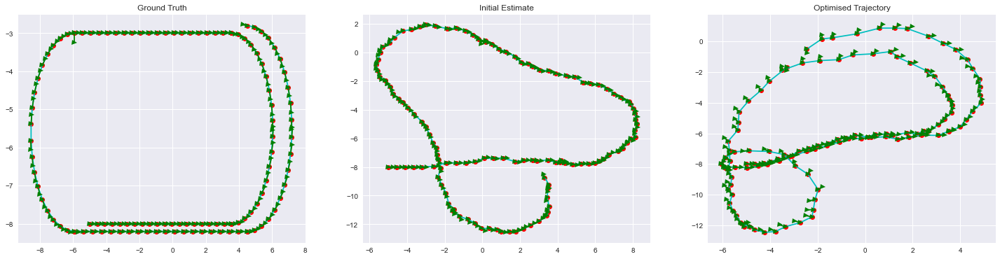

ITER 53 ERROR 13922.625


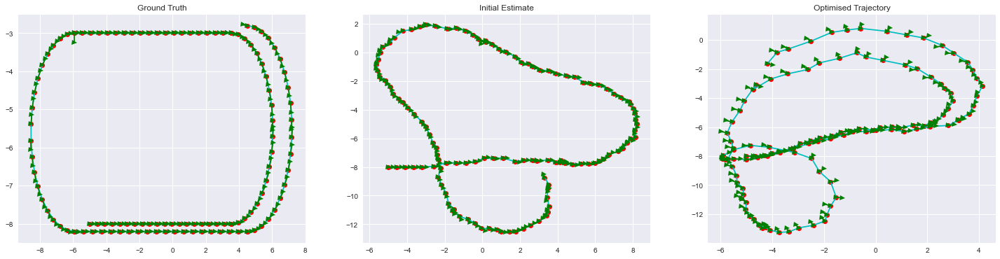

ITER 54 ERROR 18167.62


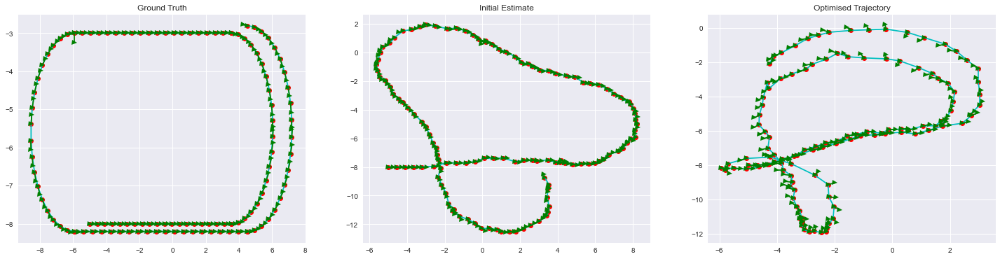

ITER 55 ERROR 6749.698


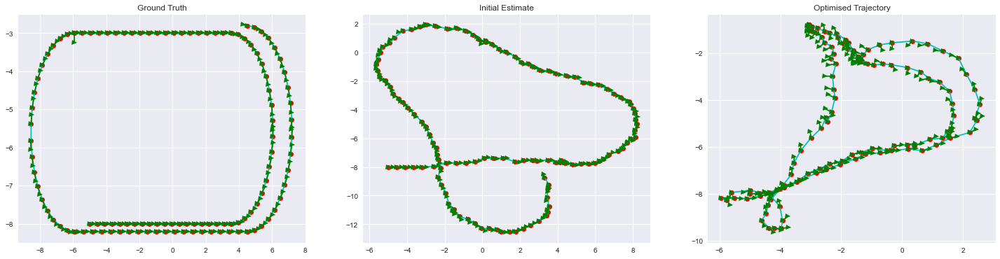

ITER 56 ERROR 3416.4722


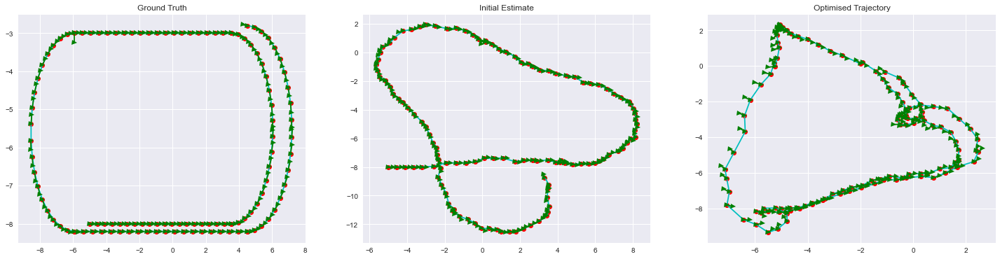

ITER 57 ERROR 2776.081


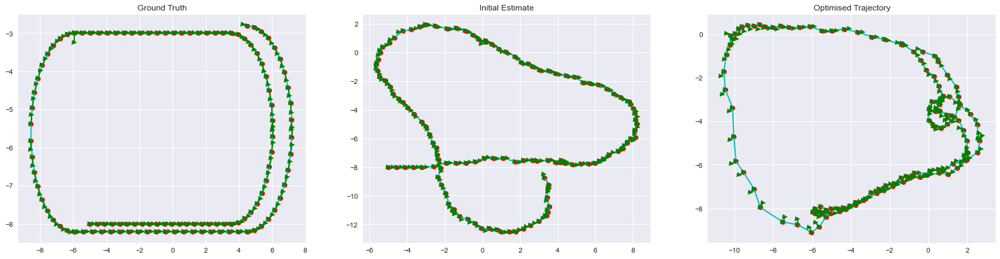

ITER 58 ERROR 1086.5214


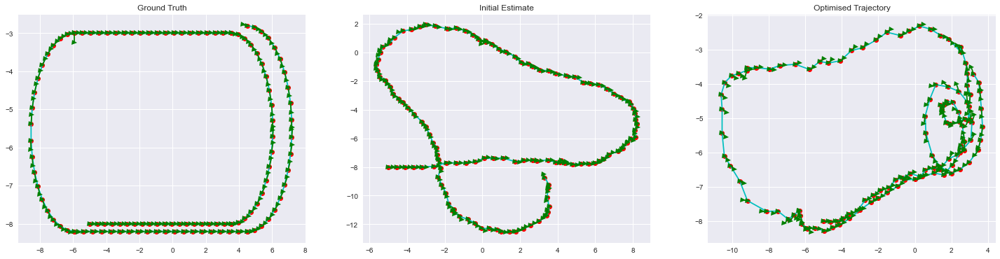

ITER 59 ERROR 4404.4844


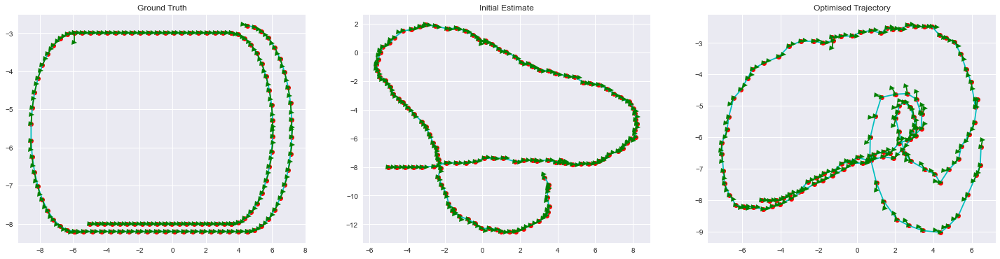

ITER 60 ERROR 4431.727


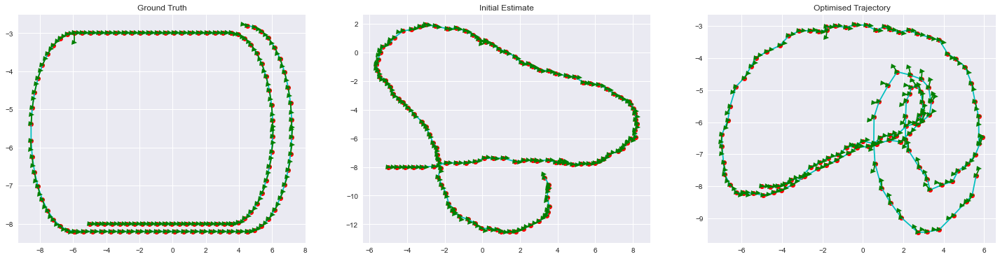

ITER 61 ERROR 3743.7004


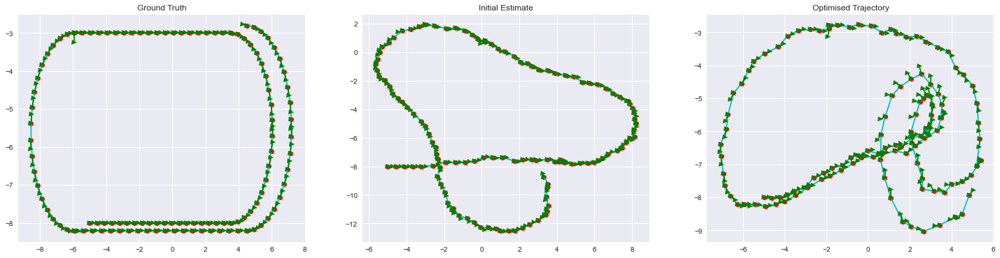

ITER 62 ERROR 2340.2349


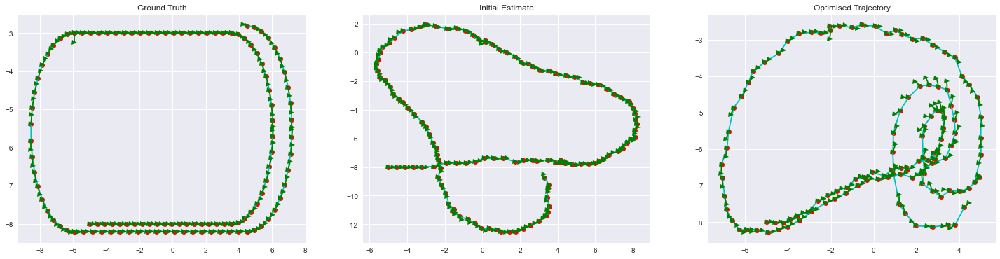

ITER 63 ERROR 1162.6266


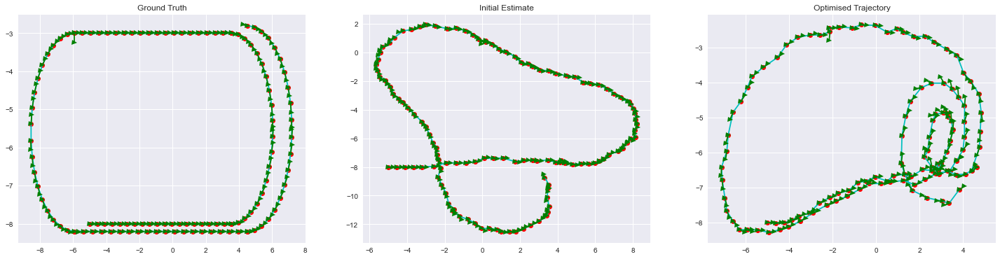

ITER 64 ERROR 498.47488


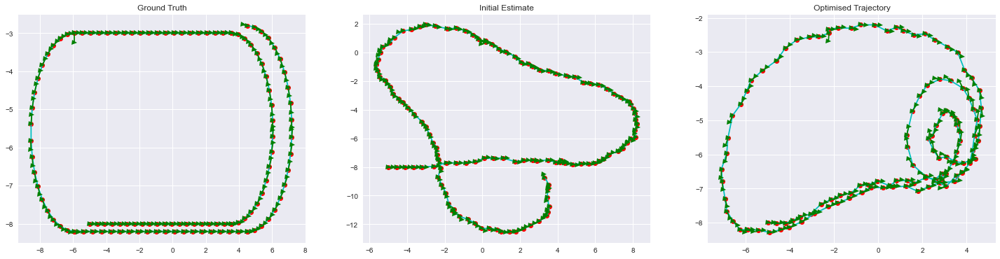

ITER 65 ERROR 252.72264


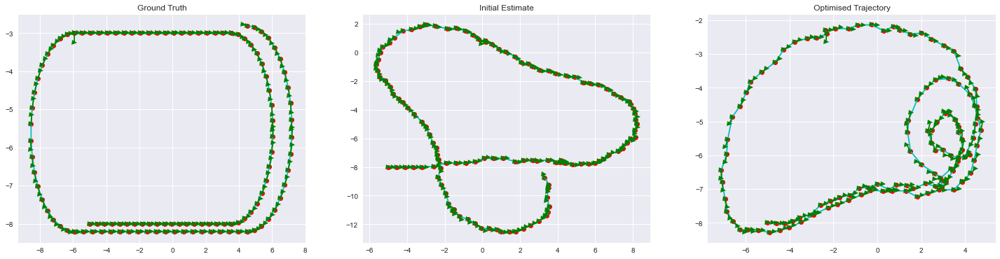

ITER 66 ERROR 187.9609


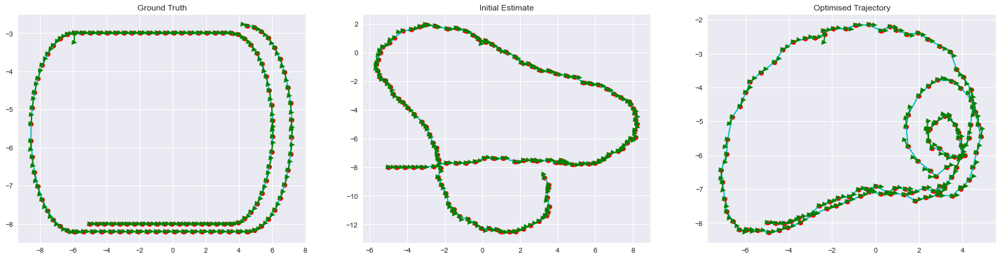

ITER 67 ERROR 173.2876


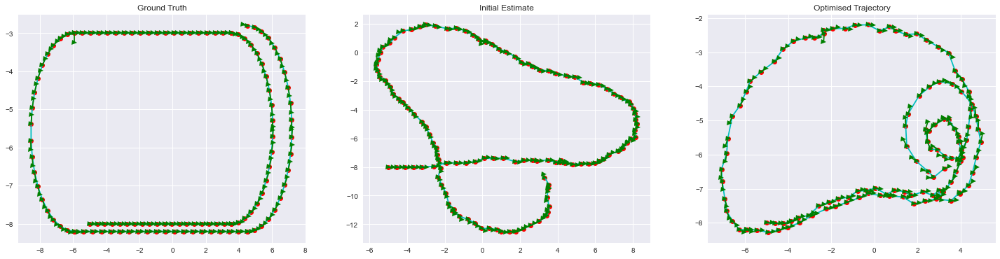

ITER 68 ERROR 169.70593


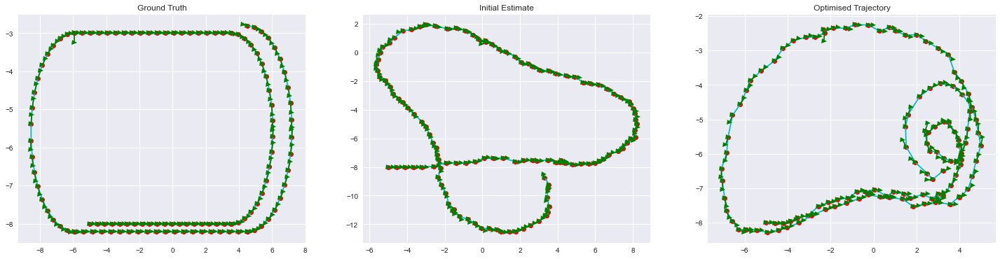

ITER 69 ERROR 168.54562


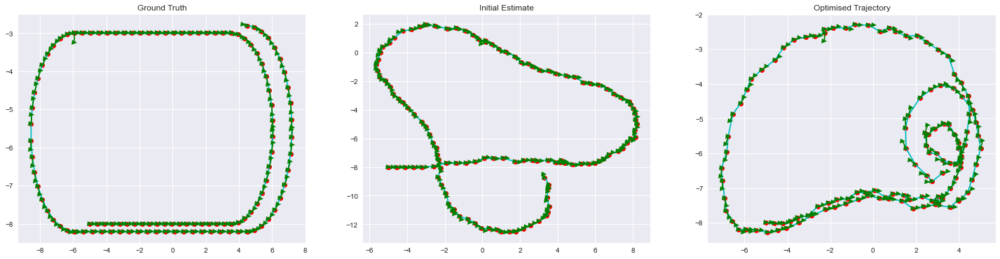

ITER 70 ERROR 168.0027


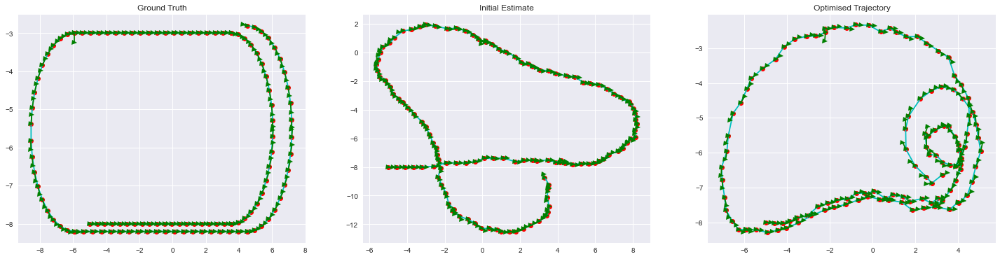

ITER 71 ERROR 167.68295


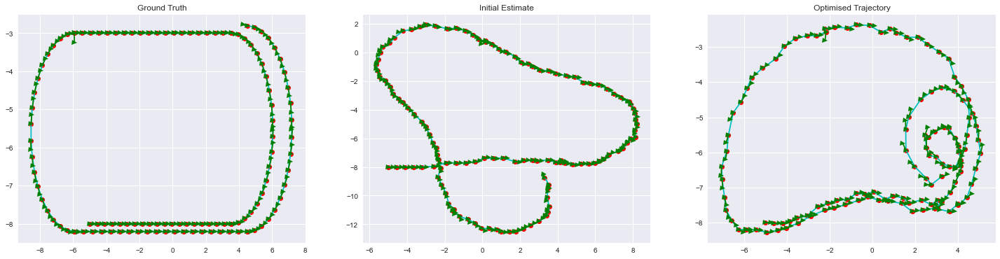

ITER 72 ERROR 167.48041


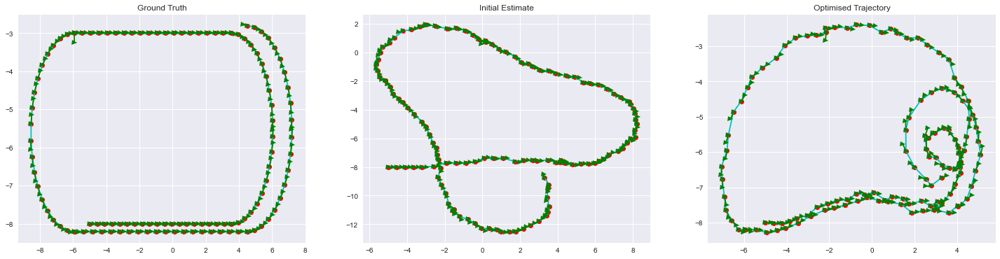

ITER 73 ERROR 167.35075


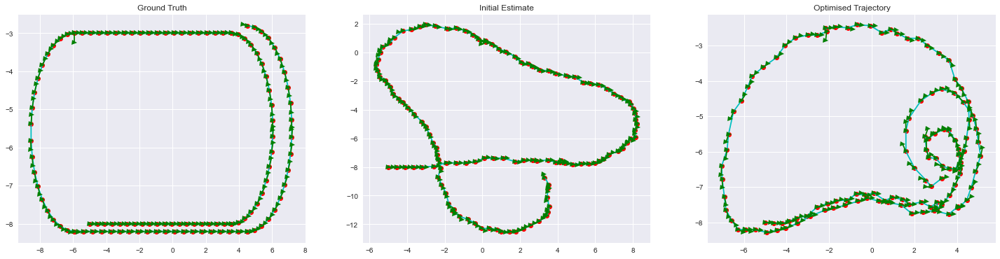

ITER 74 ERROR 167.26822


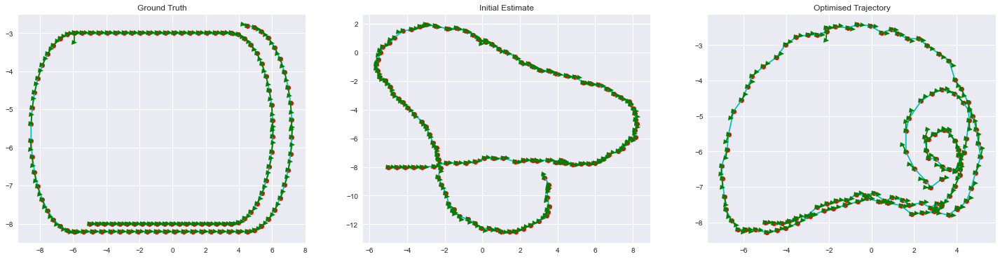

ITER 75 ERROR 167.21564


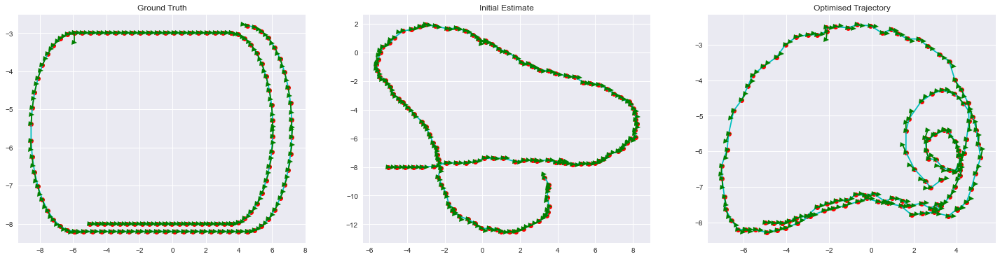

ITER 76 ERROR 167.18259


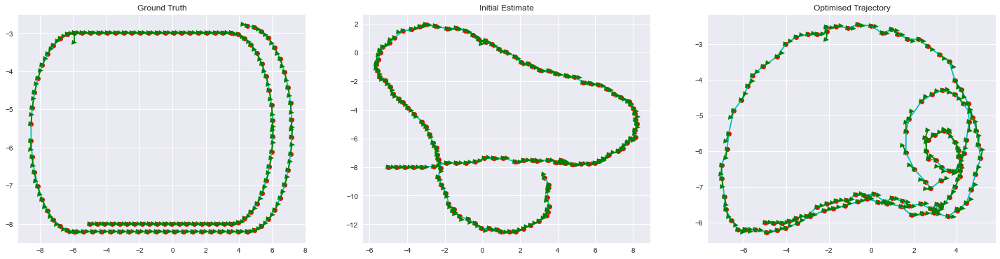

ITER 77 ERROR 167.16154


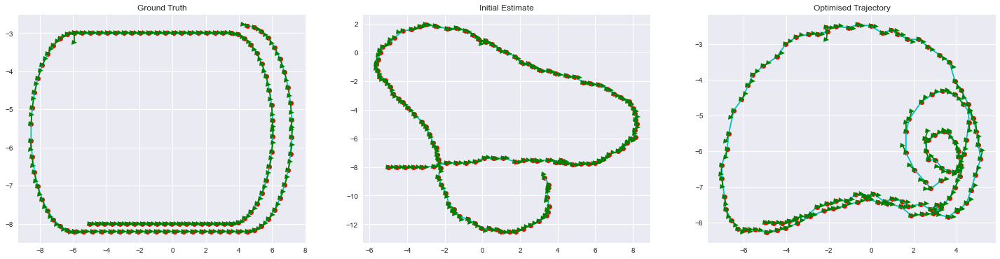

ITER 78 ERROR 167.14825


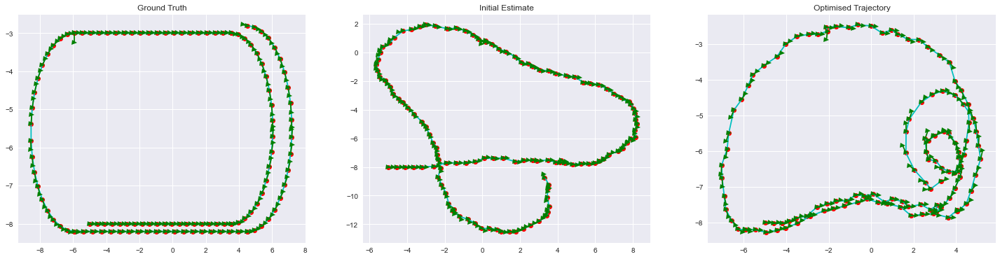

ITER 79 ERROR 167.14006


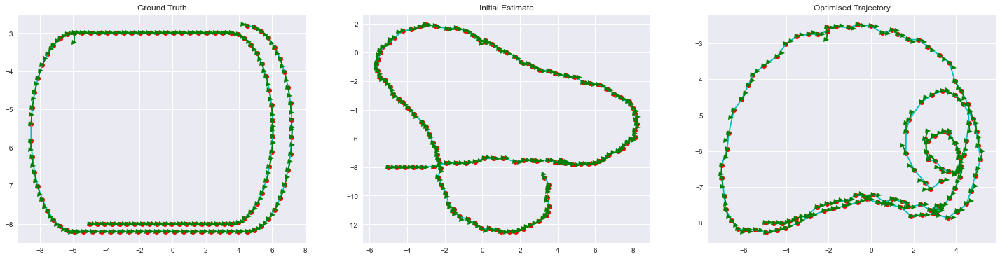

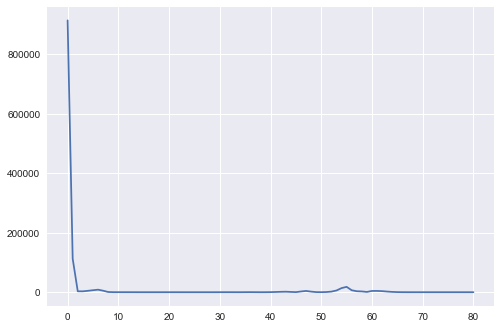

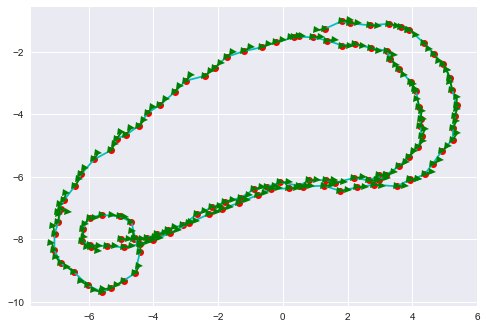

CPU times: user 18min 45s, sys: 2min 34s, total: 21min 20s
Wall time: 15min 17s


In [13]:
%%time
poses_history, errors_history = optimise_lm(poses, edges, anchor, num_iters = 80)
plt.plot(errors_history)
plt.show()
best = jnp.argmin(jnp.asarray(errors_history))
draw(poses_history[best][:, 0], poses_history[best][:, 1], poses_history[best][:, 2])
write_poses(poses_history[best], 'opt.g2o')

## Best trajectory

Error:  134.57094


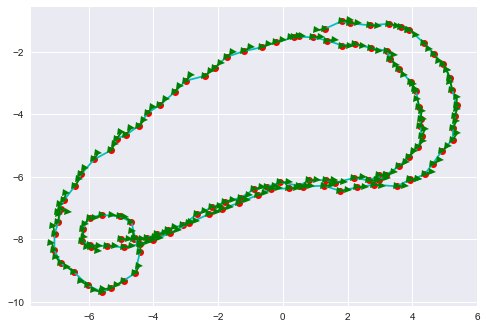

In [17]:
print("Error: ", errors_history[best])
best = jnp.argmin(jnp.asarray(errors_history))
draw(poses_history[best][:, 0], poses_history[best][:, 1], poses_history[best][:, 2])

## 2.1 Answer

Give a detailed answer addressing the above questions. When I run the above code, it should follow points described above (such as plots at every 10 steps) and (When I run the above code, it should) write the optimized poses to a file named `opt.g2o`. As a backup, save another file `opt_backup.g2o` in an offline manner beforehand.

That apart, save important plots and add them here so that it can supplement your answer, for example you could add plots at crucial stages of optimization. You have to add useful metrics/plots from `EVO` (refer to supplementary notebook). Using EVO, the bare minimum you have to report is `mean absolute pose error (ape)` and `mean relative pose error (rpe)`. However, you are encouraged to use tools like `evo_traj` and [more](https://github.com/MichaelGrupp/evo/#command-line-interface) and add more plots/metrics. Marks will be awarded based on overall analysis & presentation which would reflect your understanding.

Note that `EVO` and `g2o_viewer` (below) could help you in debugging.

Add answer for 2.1 here:

## Approach

The non-linear nature of this optimization meant that it is highly susceptible to hyperparameters and initialization. While the initialization is fixed in this case at what the odometry edges give us, the hyperparameters required heavy tuning to achieve better estimates.

While the damping factor of levenberg marquadt algorithm also affects the algorithm's performance, the effect of the information matrix was much more significant, and hence is discussed in more detail.

The information matrix determines how much confidence we have in a particular constraint, thereby penalising the violation of that constraint more heavily. Because all of our constraints are soft, they are all simultaneously optimised for, and the information matrix plays a major role in determining their relative importance. Because loop closures are typically more accurate than bare odometry constraints, and because we are using the loop closure contraints to optimise what odometry already gave us, we attributed higher confidence values (or, correspondingly, lower variance to the gaussian random variables) to loop closure constraints than odometry constraints. The initial anchoring constraint was attributed an even higher confidence because initial positions are assumed to be known with practically no error. We then experimented with information matrix values that respected the above assumptions and deductions.

We tried upto a 1000 iterations of the levenberg marquadt algorithm, and noticed no significant improvement after a few 100, as the error vs iteration graph above shows (scroll through the output). This is to be expected as the algorithm converges to a local minimum. The minor variations that are, however, visible in the graph highlight the non-linear and non-convex nature of this optimisation.

### Various outputs

* We used information matrix values of 50, 5000, 5000 (odometry, loop closure, anchor respectively) and achieved an error of 84.6 in approximately 80 iterations as shown below.
<td> <img src="./misc/analyze/84.png" style="width: 800px;"/> </td>

* We used information matrix values of 200, 700, 1000 (odometry, loop closure, anchor respectively) and achieved the below trajectory in approximately 35 iterations with an error of 950.
<td> <img src="./misc/analyze/2.png" style="width: 800px;"/> </td>

* We used information matrix values of 100, 1000, 2000 (odometry, loop closure, anchor respectively) and achieved an error of 134 in apprx 27 iterations.
<td> <img src="./misc/analyze/opt.png" style="width: 800px;"/> </td>

This error depends on the values of the information matrix, as that is what determines the relative importance of the constraints. However, this makes it difficult to compare the results generated using different values of the information matrix, because the norm of the information matrix would affect the error. The error generated by EVO, which compares the optimised trajectory with the ground truth, is hence a better measure.

Based on the EVO errors and the shape of the trajectory itself (especially compare the erroneous small loops inside), we determine that the *third one is the best trajectory*, and its EVO output is attached below.

Notice how all of these trajectories are able to align the portions of the graph with loop closures, which is a result of the high confidence attributed to those edges.

### Analyze optimised trajectory with EVO

In [3]:
! cp 'dataset/gt.txt' 'gt.g2o'
! python3 'misc/g2o_to_kitti.py' 'gt.g2o' 'gt.kitti'
! python3 'misc/g2o_to_kitti.py' 'opt.g2o' 'opt.kitti'

Figure(640x480)
saved 'gt.kitti' from 'gt.g2o'
Figure(640x480)
saved 'opt.kitti' from 'opt.g2o'


In [4]:
! evo_rpe kitti gt.kitti opt.kitti

RPE w.r.t. translation part (m)
for delta = 1 (frames) using consecutive pairs
(not aligned)

       max	0.288498
      mean	0.121417
    median	0.118141
       min	0.017799
      rmse	0.137628
       sse	2.254047
       std	0.064804



In [5]:
! evo_ape kitti gt.kitti opt.kitti

APE w.r.t. translation part (m)
(not aligned)

       max	5.820277
      mean	2.636365
    median	2.851491
       min	0.000000
      rmse	2.974295
       sse	1061.571958
       std	1.376957



In [7]:
! evo_traj kitti gt.kitti opt.kitti -v --plot --plot_mode xy

--------------------------------------------------------------------------------
Loaded 120 poses from: gt.kitti
Loaded 120 poses from: opt.kitti
--------------------------------------------------------------------------------
name:	gt
infos:
	nr. of poses	120
	path length (m)	52.976517997999295
	pos_end (m)	[-2.8 -4.5  0. ]
	pos_start (m)	[-8.  5.  0.]
--------------------------------------------------------------------------------
name:	opt
infos:
	nr. of poses	120
	path length (m)	54.50845505736037
	pos_end (m)	[-1.259315  -1.3111949  0.       ]
	pos_start (m)	[-8.  5.  0.]


## Analyzation with EVO

* Left figure shows both ground truth (in blue) and optimised trajectory (in green) together on coordinate axis
* Right figure shows comparison of x,y and z coordinates of ground truth (in blue) and optimised trajectory (in green) plotted individually. We have 2D slam that's why z coordinates is always 0.

<td> <img src="./misc/evo/1.png" alt="EVO 1" style="width: 600px;"/> </td>
<td> <img src="./misc/evo/2.png" alt="EVO 2" style="width: 600px;"/> </td>

* Left figure shows comparison of roll,pitch and yaw angles of ground truth (in blue) and optimised trajectory (in green) plotted individually.
* Right figure shows our optimised trajectory as plotted with g2o_viewier.


<td> <img src="./misc/evo/3.png" alt="EVO 3" style="width: 800px;"/> </td>
<td> <img src="./misc/evo/opt_g2o.png" alt="EVO 3" style="width: 800px;"/> </td>

We used EVO plots for debugging purpose. We compared x,y coordinates and yaw angle of ground truth and optimised trajectory and figured out if problem was coming in x axis, y axis or with yaw angle. In this way we got to understand easily issues in our optimisation process.

In [8]:
! g2o_viewer opt.g2o

## 2.2 Using g2o's optimization: g2o binary or g2o viewer 

Installation setup is described in supplementary notebook. More details for 2.2.1 and 2.2.2 can be found in the supplementary notebook.

### 2.2.1 Optimizing `edges.txt`
First task is to optimize the poses of dataset you've been working with so far.

### 2.2.2 Optimizing `intel` and `sphere` datasets
You have been given two datasets in the `data` folder. You have to use `g2o_viewer` to optimize these both. You have to experiment with the options/parameters available in the GUI. More instructions in supplementary notebook. You have to experiment till you get the trajectories which look like the following:

<table><tr>
<td> <img src="./misc/intel.jpg" alt="Drawing" style="width: 250px;"/> </td>
<td> <img src="./misc/sphere.jpg" alt="Drawing" style="width: 250px;"/> </td>
</tr></table>

## 2.2 Answer

Add images: take screenshot of the GUI of `g2o_viewer` after optimization for all 3 [[CP-M]] and add here. Briefly describe what you had to do (detailed answer is not expected). g2o could potentially give you close to ground truth trajectory for all 3, but if you are unable to get to close to ground truth, add the best you can get.

# Edges
Comparison of trajectory made up of given poses (left), after intial guess (right)

<table><tr>
<td> <img src="./misc/edges_original.png" alt="Original image of edges" style="width: 500px;"/> </td>
<td> <img src="./misc/edges_initialguess.png" alt="Initial guess on edges" style="width: 500px;"/> </td>
</tr></table>

After optimisation with our code

<td> <img src="./misc/edges_opt.png" alt="Optimised trajectory (fron our code) of edges" style="width: 800px;"/> </td>

After optimisation with g2o.                           
Optimisation was done with Gauss Newton optimizer with 5-6 iterations.

<td> <img src="./misc/edges_optimised.png" alt="Optimised trajectory (with g2o) of edges" style="width: 800px;"/> </td>

# Intel
Comparison of trajectory made up of given poses (left), after intial guess (right)


<table><tr>
<td> <img src="./misc/intel_original.png" alt="Original image of intel" style="width: 500px;"/> </td>
<td> <img src="./misc/intel_initialguess.png" alt="Initial guess on intel" style="width: 500px;"/> </td>
</tr></table>

After optimisation.                              
For optimisation we used Gauss Newton optimizer and achieved best results with just 5-6 iterations.
<td> <img src="./misc/intel_optimised.png" alt="Optimised trajectory of intel" style="width: 800px;"/> </td>

# Sphere
Comparison of trajectory made up of given poses (left), after intial guess (right)

<table><tr>
<td> <img src="./misc/sphere_original.png" alt="Original image of sphere" style="width: 500px;"/> </td>
<td> <img src="./misc/sphere_initialguess.png" alt="Initial guess on sphere" style="width: 500px;"/> </td>
</tr></table>

Below results were obtained after running 100 iterations with default configs and Gauss Newton optimizer. But as we can see in figure sphere is not perfect there is some problem at one hole of sphere.

<td> <img src="./misc/sphere_partialoptimised.png" alt="Partial optimised trajectory of sphere" style="width: 800px;"/> </td>

Below is final optimised sphere. For this we use Robust Kernel option of g2o_viewer with Kernel Width 10.0 and ran it for 100 iterations. We can notice that chi2 value reduced from apprx 8L in above image to apprx 4L in below image.

<td> <img src="./misc/sphere_optimised.png" alt="Optimised trajectory of sphere" style="width: 800px;"/> </td>

###  * Important Information regarding Questions 3  & 4
Note that it is mandatory to attempt EITHER 3 OR 4, only one of it. If you attempt both, the question which you score more will be considered and the other as bonus question. 

It is encouraged for those into robotics/deep learning research to prefer 4 over 3.

# [Bonus*] 3. Deriving Motion model geometrically
\* -> read information above under section "Important Information regarding Questions 3  & 4"

 
The current robot state is as follows: ($i$ and $k$ are interchangably used below, sorry I am too lazy to edit now 😛)  
![robot-situation.png](./misc/robot-situation.png)

Can you derive the below equation using geometry? (Read on)

$$x_{k+1} = x_{k} + \Delta x_{(k,k+1)} \cos(\theta_k) - \Delta y_{(k,k+1)} \sin(\theta_k) \\
y_{k+1} = y_{k} + \Delta y_{(k,k+1)} \cos(\theta_k) + \Delta x_{(k,k+1)} \sin(\theta_k) \\
\theta_{k+1} = \theta_{k}+  \Delta \theta_{(k,k+1)} \tag{3}$$

In other words, we want to find $\delta$'s in terms of $\Delta$'s
$$\delta x = \Delta x \cos(\theta) - \Delta y \sin(\theta) \\
\delta y = \Delta y \cos(\theta) + \Delta x \sin(\theta) \tag{2}$$

where $\delta$'s are the updates in our motion model equation:
$$ x_{k+1} = x_{k} + \delta x \\
y_{k + 1} = y_k + \delta y \\
\theta_{k+1} = \theta_{k} + \delta \theta \tag{1}$$

Oh yes, $\theta$ is straightforward, i.e. $\delta \theta = \Delta \theta$ but why? 

Using geometry, you could just draw and insert a self-explanatory image as the answer to this question.

If you can derive it without using geometry purely using transform matrices/algebra, that is fine too. Whatever you're comfortable.

## 3. Answer
<td> <img src="./misc/Q3.jpg" alt="Answer to q3" style="width: 800px;"/> </td>


# [Bonus*] 4. Research Paper Reading
\* -> read information above under section "Important Information regarding Questions 3  & 4"

(Do not get intimidated, you are not expected to do a thorough research analysis for this task. A high level understanding is sufficient.)


["Past, Present & Future of SLAM: Towards the Robust Perception Age"](https://arxiv.org/abs/1606.05830) is an exciting survey paper of 2016 which sums up, well, the "past, present & future" of SLAM. Your task is as follows:

1. Go through the sections "IV. LONG-TERM AUTONOMY II: SCALABILITY" & "III. LONG-TERM AUTONOMY I: ROBUSTNESS". Don't worry, you are not expected to have a deep understanding. Skip the parts which you don't understand at all. Go through it at a high level, and take a slightly closer look at "Open Problems" in these sections.

2. Read up common applications of deep learning for computer vision/robotics through blogs online (for example, first 4 points of [this](https://machinelearningmastery.com/applications-of-deep-learning-for-computer-vision/). Again, you are only expected to understand it at a high level, for example, 'semantic segmentation is an application of deep learning for computer vision which is the task of assigning a category to each of the pixels in the image'.

Firstly, summarize your understanding of the above two points.
   
Now, from the understanding you've gathered so far, how would you approach solving those "Open Problems"? 
Can these algorithms help in dealing with some of the issues you might have faced during this project? Can the deep learing based high level understanding of the world help in SLAM? In the context of long term autonomy, imagine tomorrow's world with a buddy robot R2-D2 which follows you wherever you go... Now imagine how easily the trajectory can diverge, how big the map could soon become and how the computation could easily become intractable.   

Answer the above questions in the context of this project and those 2 sections of the survey paper.

## 4. Answer

### Introduction

SLAM is a hard problem, intuitively, because we expect from the SLAM system both, the ability to generate a map of the surrounding, as well as the ability to localize itself in this map, and more concretely, because the optimisation is non-convex and computationally expensive, the data is often erroneous and there exist no failsafe ways of detecting loop closures, outliers or malfunctioning sensors. The sections *III. Long-Term Automony I: Robustness* and *IV. Long-Term Autonomy II: Scalability* of [1] highlight two of these major problem areas.

### Problems in Ensuring Robustness

SLAM systems are bound to receive erroneous input data. This is because the sensors generating this data would inevitably be susceptible to physical noise, and the algorithms detecting loop closures and associating data (i.e, matching the sensor input to a particular landmark) at the front-end aren't fool proof (for example, perceptual aliasing, which happens when two different sensory inputs lead to the same sensor signature, is bound to cause such problems, as there is no way of determining from the sensor signature which input it actually was).

The reasons that lead to errors in data association are several. Apart from perceptual aliasing, the common assumption that the world is static is often untrue and can introduce erroneous data points. Certain environments (such as those which change rapidly or those where certain sensors cannot be used, example LiDAR underwater) are inherently difficult to work with. While short-term data association using techniques like optical flow is straightforward (as the sensory inputs change slowly as compared to the refresh rate), long-term data association requires loop closure, and is particularly challenging. This is because brute-force matching across everything seen before quickly ceases to be an option because of its time and memory complexity, and we need to resort to techniques such as *bag of visual words*. These techniques maintain a set of distinct features that allow for more efficient search, but are nevertheless susceptible to illumination and similar variations.

To make matters worse, the algorithms processing this data at the back-end are heavily susceptible to such outliers in the data - because they usually optimise non-convex, non-linear costs. The ability of the back-end to filter outliers depends upon the initial estimate fed to the system and a single outlier passing through adversely affects the estimate, which further degrades the system's ability to detect outliers. While it is usually considered better to not include a true positive than to include a false negative loop closure, the former deprives the system of helpful data and the latter can severely degrade the quality of the estimate. There has been some work in making the back-end resilient to the spurious loop closures that the front-end lets pass. Some approaches try to detect them *a priori*, if they are very disparate as compared to the odometry constraints, while other approaches look at the residual error as a result of including them in order to make the claassfication.

In case of dynamic environments, the SLAM algorithm should firstly be able to detect and ignore short-term changes, such as people and objects moving and secondly, adapt the map to long-term/permanent changes in the landscape. This introduces questions such as when is it okay, if ever, to forget.

### Problems in Ensuring Scalability

The problem of scalability emerges when we start looking away from short-term runs and indoor environments to long-term autonomy - such as agents mapping the world's oceans and terrain, cleaning cities or friendly R2-D2s following their humans around. Most non-linear least-squares solvers have a complexity quadratic in the number of variables, which becomes intractable as the number of poses and edges increases. The pose graph is known to be sparse, however adding features belonging to the same spatial region over time compromise this sparsity.

The solutions tackle this problem in two ways, either by sparsifying the graph, or by distributing the computational load between parallel compute units or multiple agents.

The former approach either tries to use information theoretic insights to screen away less informative nodes, or avoids adding nodes from the same region again and again (just adds new edges, instead). They further optimise the paths in batches consisting of sliding windows, or use regularisation, kernels or alternate basis representations to ensure sparsity.

The latter approach tries to perform the optimisation simultaneously on multiple processing units. This requires that the problem be broken into subproblems that can be optimised independently. One way is to divide the factor graph into multiple subgraphs which are separately optimised followed by a global refinement. The SLAM problem itself can be delegated to multiple agents, which could follow either a centralised or a decentralised architecture. Such solutions introduce new problems, such as getting information where it's needed from one agent to the other (for example, detecting loop closures across agents).

For systems that collect data for extended periods of time, forgetting, or offloading not-recently used regions is important for ensuring scalability, as well as for keeping the map up-to-date.

### Use of Deep Learning

Computer vision has moved from statistical to deep learning methods, because of the ability of networks comprising of multiple layers to utilise semantically rich representations of the data. This semantic awareness allows SLAM algorithms to look away from points and features and instead at objects and compositions. These techniques are already solving and have the potential to solve several problems that SLAM faces.

The following paragraphs list out some of the open problems described above and in [1], and discuss how deep learning and SLAM can help solve them.

**Dynamic Environments:** By semantically segmenting the scene and identifying and ignoring moving objects, their effects on the accuracy of the SLAM algorithms can be minimised. While optical flow can be used to detect motion, object detection convolutional neural networks that rely on semantics do a much better job, for example, by detecting objects that aren't currently moving but still don't belong in a map (such as a stationary car on the road side). [2,3] describe such approaches in detail.

**Large Pose Graphs:** As we discussed above, long-term autonomy can lead to intractably large trajectories, which cannot be optimised as a whole. Semantic information helps again. Assuming that rich hierarchial semantic information pertaining to which parts of the trajectory lie in the same rooms, which rooms lie in the same building etc is available, we can first locally optimise parts of the trajectory in the same rooms, or at places near loop closures, and gradually expand out the errors up the hierarchy. This would not only make the computations manageable and efficient, but also allow errors in one region from adversely affecting parts of the trajectory far away.

**Semantic Global Registration:** The SLAM front-ends often use global registration to find out the transformations between point clouds, and hence between robot poses (this is one way of generating the odometry/loop closure constraints). Providing large point clouds to these global registration algorithms is often detrimental to their performance, as objects such as ceiling, floor and walls or other surfaces that can slide over one another often provide little help in registration (there are infinite ways to fit them on top of each other), but significantly add to the computational complexity and often confuse the algorithm. Semantic information can be used to segment out highly geometrical objects such as furniture, which can really be registered in only one way, and are small enough to be manageable. Ongoing research shows this approach allows for registration of highly disparate views as well.

**Varying and Deformable Maps:** Semantic information can help an agent determine which parts of a map are likely to change over long periods, for example, trees are more likely than mountains, which can be used to determine what parts of a map to update.

**Automatic Parameter Tuning:** One approach to tackle this could be to let the agent classify its environment from a predefined set of classes based on semantic understanding. Deep-learning based detection and classification can be used to classify the scene as, for example, indoors or outdoors, natural or urban etc. Because these classes determine properties such as the amount of free space, how close the robot is expected to come to obstacles, how static or dynamic the environment is etc, they would inevitably determine the hyperparameters, which can then be selected from a predefined table. Deep learning can also be used to learn these classes and the corresponding parameters as well.

### References

[1] C. Cadena and L. Carlone and H. Carrillo and Y. Latif and D. Scaramuzza and J. Neira and I. Reid and J.J. Leonard, “Past, Present, and Future of Simultaneous Localization And Mapping: Towards the Robust-Perception Age”, in IEEE Transactions on Robotics 32 (6) pp 1309-1332, 2016

[2] Zemin Wang, Qian Zhang, Jiansheng Li, Shuming Zhang and Jingbin Liu, "A Computationally Efficient Semantic SLAM Solution for Dynamic Scenes", 2019

[3] Linhui Xiao, Jinge Wang, Xiaosong Qiu, Zheng Rong, Xudong Zou, "Dynamic-SLAM: Semantic monocular visual localization and mapping based on deep learning in dynamic environment", 2019

### Fun section
Check the end of your Project-1 homepage on Notion. :)